# CNN For Detection

In [1]:
import os
import glob
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from collections import Counter
#import optuna
from IPython.display import Image,display
#from ultralytics import YOLO
import shutil
import random
import albumentations as A
import pytesseract
import easyocr



In [6]:
# Specifying the paths for training, validation, and testing datasets
train_path = "/content/drive/MyDrive/data/train"
test_path = "/content/drive/MyDrive/data/test"
valid_path = "/content/drive/MyDrive/data/valid"

# Setting the image size for my model's input
IMG_SIZE = (224, 224)

### Loading and preprocessing Image

In [2]:
def load_and_preprocess_image(image_path):
    """
    Load and preprocess an image for model input.

    This function reads an image from the specified file path, resizes it to match
    the expected input dimensions (IMG_SIZE), and normalizes its pixel values to
    improve model performance.

    Parameters:
    image_path (str): Path to the image file.

    Returns:
    numpy.ndarray: Preprocessed image array ready for model inference.
    """

    # Loading the image and resizing it to match my model's input requirements
    image = load_img(image_path, target_size=IMG_SIZE)

    # Converting the image to a NumPy array and normalizing pixel values between 0 and 1
    image = img_to_array(image) / 255.0

    # Returning the processed image
    return image


### Annotation Parsing for Object Detection

In [3]:
def parse_annotations(folder_path):
    """
    Parse XML annotation files and extract bounding box data.

    This function reads XML annotation files from a given folder, extracts relevant
    object details such as bounding box coordinates and labels, and normalizes the
    coordinates based on image dimensions. Additionally, it tracks all unique labels
    found in the dataset.

    Parameters:
    folder_path (str): Path to the folder containing XML annotation files.

    Returns:
    list: A list where each entry contains:
        - filename (str): Name of the image file.
        - objects (list): A list of bounding boxes with normalized coordinates and class labels.
                         Each bounding box is represented as [xmin, ymin, xmax, ymax, label].
    """

    # Initializing a list to store the parsed annotation data
    data = []

    # Keeping track of all unique object labels found in my dataset
    unique_labels = set()

    # Looping through all annotation files in the given folder
    for file in os.listdir(folder_path):
        if file.endswith(".xml"):  # Processing only XML annotation files
            file_path = os.path.join(folder_path, file)

            # Parsing the XML file and extracting the root element
            tree = ET.parse(file_path)
            root = tree.getroot()

            # Extracting the image filename and dimensions
            filename = root.find('filename').text
            width = int(root.find('size/width').text)
            height = int(root.find('size/height').text)

            objects = []

            # Extracting bounding box details for each detected object
            for obj in root.findall('object'):
                obj_name = obj.find('name').text.lower()  # Converting to lowercase for consistency
                unique_labels.add(obj_name)  # Storing unique label names

                # Extracting bounding box coordinates and normalizing them
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text) / width
                ymin = int(bndbox.find('ymin').text) / height
                xmax = int(bndbox.find('xmax').text) / width
                ymax = int(bndbox.find('ymax').text) / height

                # Assigning labels (1 for license plate, 0 for other objects)
                label = 1 if obj_name == "licenseplate" else 0

                # Storing the bounding box and its label
                objects.append([xmin, ymin, xmax, ymax, label])

            # Storing the extracted data for the image
            data.append([filename, objects])

    # Printing unique labels detected in the dataset
    print("Unique Labels Found in Dataset:", unique_labels)

    return data


### Count License Plates in Training Dataset

In [7]:
# Parse the annotation files in the training dataset
train_annotations = parse_annotations(train_path)

# Count the number of license plates detected in the dataset
num_license_plates = sum(1 for item in train_annotations for obj in item[1] if obj[4] == 1)

# Print the total number of license plates found
print("Number of License Plates Detected in Dataset:", num_license_plates)

Unique Labels Found in Dataset: {'car', 'licenseplate'}
Number of License Plates Detected in Dataset: 646


### Load and Prepare Training Dataset

In [8]:
# Parse annotation files to extract image data and bounding boxes
train_annotations = parse_annotations(train_path)

# Initialize empty lists to store processed images, bounding boxes, and labels
train_images, train_bboxes, train_labels = [], [], []

# Iterate through the parsed annotations
for row in train_annotations:
    image_path = os.path.join(train_path, row[0])  # Get full image path

    if os.path.exists(image_path):  # Ensure the image file exists
        image = load_and_preprocess_image(image_path)  # Load and preprocess the image

        # Extract bounding boxes and labels for all detected objects in the image
        for obj in row[1]:
            bbox = obj[:4]  # Bounding box coordinates (xmin, ymin, xmax, ymax)
            label = obj[4]   # Object class (Car = 0, License Plate = 1)

            # Store extracted data in corresponding lists
            train_images.append(image)
            train_bboxes.append(bbox)
            train_labels.append(label)

# Convert lists to NumPy arrays for efficient processing
train_images = np.array(train_images)
train_bboxes = np.array(train_bboxes)
train_labels = np.array(train_labels)

# Print dataset distribution statistics
print("Final Dataset Distribution - License Plates:", np.sum(train_labels == 1))
print("Final Dataset Distribution - Cars:", np.sum(train_labels == 0))


Unique Labels Found in Dataset: {'car', 'licenseplate'}
Final Dataset Distribution - License Plates: 646
Final Dataset Distribution - Cars: 170


 ### Data Augmentation for License Plate Images

In [9]:
# Setting up the augmentation pipeline with different transformations
data_generator = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Lists to store augmented images, bounding boxes, and labels
augmented_images, augmented_bboxes, augmented_labels = [], [], []

# Looping through training images and applying augmentation only to license plates
for i in range(len(train_images)):
    if train_labels[i] == 1:  # Augmenting only license plate images
        img = train_images[i].reshape((1,) + train_images[i].shape)  # Reshaping for generator
        gen = data_generator.flow(img, batch_size=1)  # Generating augmented images

        # Creating 3 augmented versions of each license plate image
        for _ in range(3):
            aug_img = next(gen)[0]  # Getting the augmented image
            augmented_images.append(aug_img)
            augmented_bboxes.append(train_bboxes[i])  # Keeping bounding box unchanged
            augmented_labels.append(1)  # Keeping class label as "license plate"

# Converting augmented data to NumPy arrays for efficient processing
augmented_images = np.array(augmented_images, dtype=np.float32)
augmented_bboxes = np.array(augmented_bboxes, dtype=np.float32)
augmented_labels = np.array(augmented_labels, dtype=np.int32)

# Merging augmented data with the original dataset
if augmented_images.shape[0] > 0:  # Making sure augmentation was applied
    train_images = np.concatenate([train_images, augmented_images], axis=0)
    train_bboxes = np.concatenate([train_bboxes, augmented_bboxes], axis=0)
    train_labels = np.concatenate([train_labels, augmented_labels], axis=0)

# Printing the final dataset shape after augmentation
print("Final Training Data Shape:", train_images.shape)


Final Training Data Shape: (2754, 224, 224, 3)


In [10]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)


### IoU Loss Function for Bounding Box Regression

In [11]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow.keras.backend as K

# Define IoU Loss Function
def iou_loss(y_true, y_pred):
    xA = K.maximum(y_true[..., 0], y_pred[..., 0])
    yA = K.maximum(y_true[..., 1], y_pred[..., 1])
    xB = K.minimum(y_true[..., 2], y_pred[..., 2])
    yB = K.minimum(y_true[..., 3], y_pred[..., 3])

    intersection = K.maximum(0.0, xB - xA) * K.maximum(0.0, yB - yA)
    true_area = (y_true[..., 2] - y_true[..., 0]) * (y_true[..., 3] - y_true[..., 1])
    pred_area = (y_pred[..., 2] - y_pred[..., 0]) * (y_pred[..., 3] - y_pred[..., 1])

    union = true_area + pred_area - intersection
    iou = intersection / (union + K.epsilon())

    return 1 - iou  # IoU loss should be minimized

# Define Improved CNN Model
input_layer = Input(shape=(224, 224, 3))

# Feature Extraction
x = Conv2D(64, (3,3), activation='relu', padding="same")(input_layer)
x = MaxPooling2D(2,2)(x)
x = Conv2D(128, (3,3), activation='relu', padding="same")(x)
x = MaxPooling2D(2,2)(x)
x = Conv2D(256, (3,3), activation='relu', padding="same")(x)
x = MaxPooling2D(2,2)(x)
x = Conv2D(512, (3,3), activation='relu', padding="same")(x)
x = MaxPooling2D(2,2)(x)
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)

# Bounding Box Output (IoU Loss for Better Accuracy)
bbox_output = Dense(4, activation="linear", name="bounding_box")(x)

# Classification Output (Car = 0, License Plate = 1)
class_output = Dense(1, activation="sigmoid", name="class_label")(x)

# Define Model
model = Model(inputs=input_layer, outputs=[bbox_output, class_output])

# Compile Model with IoU Loss
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss={"bounding_box": iou_loss, "class_label": "binary_crossentropy"},
    metrics={"bounding_box": "mae", "class_label": "accuracy"}
)

# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train Model
history = model.fit(
    train_images, {"bounding_box": train_bboxes, "class_label": train_labels},
    epochs=100, batch_size=16, validation_split=0.2, callbacks=[early_stop]
)

# Save model
model.save("custom_cnn_license_plate_detector.h5")


Epoch 1/100
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - bounding_box_loss: 0.9796 - bounding_box_mae: 0.5652 - class_label_accuracy: 0.8914 - class_label_loss: 0.3334 - loss: 1.3130 - val_bounding_box_loss: 0.9770 - val_bounding_box_mae: 0.3821 - val_class_label_accuracy: 1.0000 - val_class_label_loss: 0.1034 - val_loss: 1.0797
Epoch 2/100
138/138 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - bounding_box_loss: 0.9743 - bounding_box_mae: 0.4689 - class_label_accuracy: 0.9238 - class_label_loss: 0.2460 - loss: 1.2203 - val_bounding_box_loss: 0.9765 - val_bounding_box_mae: 0.4256 - val_class_label_accuracy: 1.0000 - val_class_label_loss: 0.0662 - val_loss: 1.0424
Epoch 3/100
138/138 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - bounding_box_loss: 0.9731 - bounding_box_mae: 0.5377 - class_label_accuracy: 0.9337 - class_label_loss: 0.2016 - loss: 1.1747 - val_bounding_box_loss: 0.9786 - val_bounding_box_mae: 0.4300 - val_class_label_accuracy: 1.0000 - val_class_label_loss: 0.0790 - val_loss: 1.0562
Epoch 

### Loading Test Images and Making Predictions

In [ ]:
# Parsing test annotations to extract image paths, bounding boxes, and labels
test_annotations = parse_annotations(test_path)

# Initializing lists to store test images, bounding boxes, labels, and filenames
test_images, test_bboxes, test_labels, test_filenames = [], [], [], []

# Looping through each annotation and loading corresponding images
for row in test_annotations:
    image_path = os.path.join(test_path, row[0])

    if os.path.exists(image_path):  # Checking if the image file exists
        image = load_and_preprocess_image(image_path)  # Preprocessing the image
        bbox = row[1][0][:4]  # Taking the first detected object's bounding box
        label = row[1][0][4]  # Taking the first detected object's label

        # Storing the processed data
        test_images.append(image)
        test_bboxes.append(bbox)
        test_labels.append(label)
        test_filenames.append(row[0])

# Converting lists to NumPy arrays for efficient processing
test_images = np.array(test_images)
test_bboxes = np.array(test_bboxes)
test_labels = np.array(test_labels)

# --- Loading the Trained Model and Making Predictions ---

# Loading the trained model with the custom IoU loss function
model = tf.keras.models.load_model("custom_cnn_license_plate_detector.h5", custom_objects={"iou_loss": iou_loss})

# Predicting bounding boxes and class labels for test images
predictions = model.predict(test_images)


Unique Labels Found in Dataset: {'car', 'licenseplate'}


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step


### Visualizing Predictions with Bounding Boxes

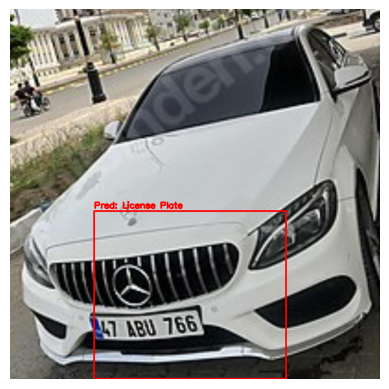

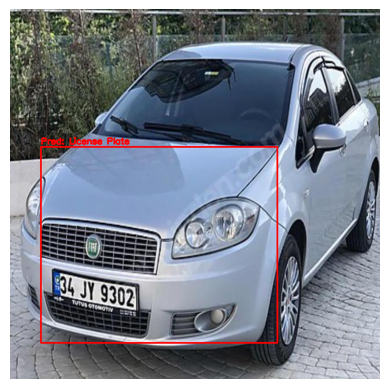

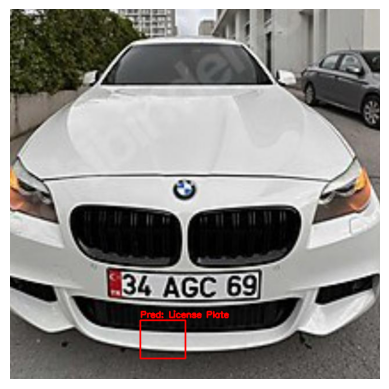

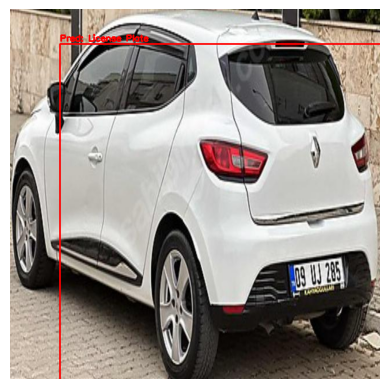

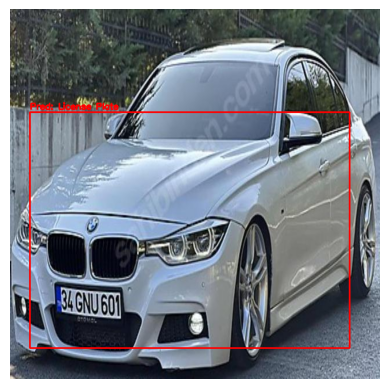

In [ ]:
def draw_bounding_box(image_path, pred_box, pred_label):
    """
    Draws predicted bounding boxes on images.

    This function loads an image, applies the predicted bounding box,
    and labels the detected object as either a car or a license plate.

    Parameters:
    image_path (str): Path to the image file.
    pred_box (list): Predicted bounding box [xmin, ymin, xmax, ymax].
    pred_label (int): Predicted class (0 = Car, 1 = License Plate).
    """

    # Reading and converting the image to RGB format
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape

    # Scaling bounding box coordinates to image size
    pred_xmin, pred_ymin, pred_xmax, pred_ymax = [int(c * w) for c in pred_box]

    # Defining class names for display
    class_names = {0: "Car", 1: "License Plate"}

    # Drawing the bounding box on the image
    cv2.rectangle(image, (pred_xmin, pred_ymin), (pred_xmax, pred_ymax), (255, 0, 0), 2)

    # Adding a label above the bounding box
    cv2.putText(image, f"Pred: {class_names[pred_label.item()]}", (pred_xmin, pred_ymin - 5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Displaying the image with the prediction
    plt.imshow(image)
    plt.axis("off")
    plt.show()

# --- Testing on 5 Sample Images ---

for i in range(5):
    draw_bounding_box(
        os.path.join(test_path, test_filenames[i]),
        predictions[0][i],  # Predicted bounding box
        (predictions[1][i] > 0.5).astype(int)  # Converting class score to binary label
    )


### Evaluation Metrics: IoU , mAp

In [ ]:
# this function to calculate the Intersection over Union (IoU) between two bounding boxes, which helps evaluate model performance.
def compute_iou(boxA, boxB):
    # Finding the coordinates of the intersection area
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Calculating the intersection area
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Calculating the areas of both bounding boxes
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Computing the IoU value
    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-6)
    return iou


# --- Function to Compute Mean Average Precision (mAP) ---

# I created this function to evaluate my model's detection performance
# across multiple IoU thresholds.
def compute_map(pred_boxes, true_boxes, iou_thresholds=[0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]):
    # Initializing lists to store precision, recall, and IoU values
    precision_list, recall_list, iou_list = [], [], []

    # Iterating over different IoU thresholds to evaluate performance
    for iou_thresh in iou_thresholds:
        tp, fp, fn = 0, 0, 0  # Resetting counters for each threshold

        # Looping through predicted and ground truth bounding boxes
        for i in range(len(pred_boxes)):
            pred_bbox = pred_boxes[i]
            true_bbox = true_boxes[i]

            # Computing IoU for the current prediction
            iou = compute_iou(pred_bbox, true_bbox)
            iou_list.append(iou)

            if iou >= iou_thresh:
                tp += 1  # Counting True Positives
            else:
                fp += 1  # Counting False Positives

            if iou < iou_thresh:
                fn += 1  # Counting False Negatives

        # Calculating Precision and Recall for the current threshold
        precision = tp / (tp + fp + 1e-6)
        recall = tp / (tp + fn + 1e-6)

        precision_list.append(precision)
        recall_list.append(recall)

    # Computing mAP50 (IoU = 0.5), a key metric in object detection benchmarks
    mAP50 = precision_list[0]

    # Computing mAP50-95 (mean precision across all IoU thresholds)
    mAP50_95 = np.mean(precision_list)

    return mAP50, mAP50_95


# --- Evaluating My Model on the Test Set ---

# Using my trained model to predict bounding boxes and class labels on test images
y_pred_bboxes, y_pred_labels = model.predict(test_images)

# Calculating the mean Average Precision (mAP) scores
mAP50, mAP50_95 = compute_map(y_pred_bboxes, test_bboxes)

# Printing the evaluation results
print(f"mAP50: {mAP50:.4f}")
print(f"mAP50-95: {mAP50_95:.4f}")


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
 mAP50: 0.0211
  mAP50-95: 0.0032


### Separating Car & License Plate Predictions

In [ ]:
# Computing metrics separately for cars and license plates
def compute_class_metrics(y_pred_bboxes, y_pred_labels, test_bboxes, test_labels, class_id):
    # Getting indices of test samples for the specified class
    indices = np.where(test_labels == class_id)[0]

    # Extracting predicted and ground truth bounding boxes for the class
    pred_boxes = y_pred_bboxes[indices]
    true_boxes = test_bboxes[indices]

    # Computing mAP metrics for the class
    return compute_map(pred_boxes, true_boxes)


# --- Computing mAP Metrics for Cars and License Plates ---

# Computing mAP for cars
car_mAP50, car_mAP50_95 = compute_class_metrics(y_pred_bboxes, y_pred_labels, test_bboxes, test_labels, class_id=0)

# Computing mAP for license plates
plate_mAP50, plate_mAP50_95 = compute_class_metrics(y_pred_bboxes, y_pred_labels, test_bboxes, test_labels, class_id=1)


# --- Printing the Results ---

# Printing car detection performance
print(f"Car mAP50: {car_mAP50:.4f}")
print(f"Car mAP50-95: {car_mAP50_95:.4f}")

# Printing license plate detection performance
print(f"License Plate mAP50: {plate_mAP50:.4f}")
print(f"License Plate mAP50-95: {plate_mAP50_95:.4f}")


 Car mAP50: 0.0909
 Car mAP50-95: 0.0136
 License Plate mAP50: 0.0000
 License Plate mAP50-95: 0.0000


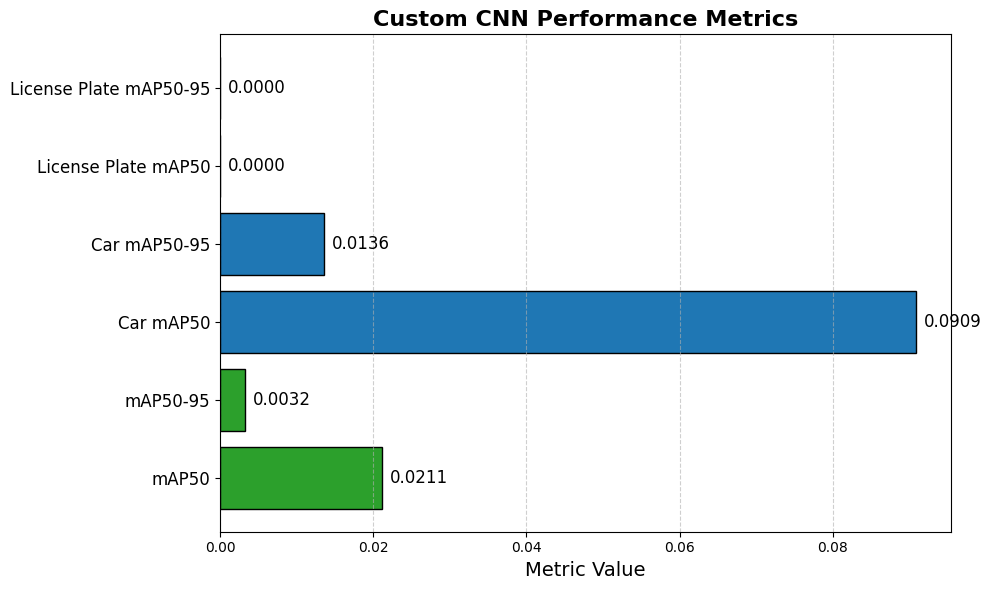

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data setup
metrics = [
    "mAP50",
    "mAP50-95",
    "Car mAP50",
    "Car mAP50-95",
    "License Plate mAP50",
    "License Plate mAP50-95"
]
values = [0.0211, 0.0032, 0.0909, 0.0136, 0.0000, 0.0000]

# Define colors based on metric categories
colors = []
for m in metrics:
    if "Car" in m:
        colors.append("#1f77b4")  # blue tones for Car metrics
    elif "License Plate" in m:
        colors.append("#ff7f0e")  # orange for License Plate metrics
    else:
        colors.append("#2ca02c")  # green for overall mAP metrics

# Create horizontal bar chart
fig, ax = plt.subplots(figsize=(10, 6))
y_positions = np.arange(len(metrics))
bars = ax.barh(y_positions, values, color=colors, edgecolor='black')

# Set titles and labels
ax.set_title("Custom CNN Performance Metrics", fontsize=16, fontweight='bold')
ax.set_xlabel("Metric Value", fontsize=14)
ax.set_yticks(y_positions)
ax.set_yticklabels(metrics, fontsize=12)
ax.grid(axis='x', linestyle='--', alpha=0.6)

# Annotate each bar with its value
for i, bar in enumerate(bars):
    width = bar.get_width()
    # Position the text a bit to the right of the bar
    ax.text(width + 0.001, bar.get_y() + bar.get_height()/2, f"{width:.4f}",
            va='center', fontsize=12, color='black')

plt.tight_layout()
plt.show()


# **Yolo Object Detection**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Changing the working directory to dataset location
%cd /content/drive/MyDrive/Data

/content/drive/MyDrive/Data


In [ ]:
ls

data.yaml        README.dataset.txt   runs/  train/  yolo11n.pt
ocr_results.csv  README.roboflow.txt  test/  valid/


### Dataset Path and File Counting

In [ ]:
# Defining the dataset path
dataset_path = '/content/drive/MyDrive/Data'

# Function to count the number of files with a specific extension in a folder
def count_files(folder_path, file_extension):
    return len(glob.glob(os.path.join(folder_path, f'*.{file_extension}')))

# Counting images and labels in the training set
train_image_count = count_files(os.path.join(dataset_path, 'train/images'), 'jpg')
train_label_count = count_files(os.path.join(dataset_path, 'train/labels'), 'txt')

# Counting images and labels in the test set
test_image_count = count_files(os.path.join(dataset_path, 'test/images'), 'jpg')
test_label_count = count_files(os.path.join(dataset_path, 'test/labels'), 'txt')

# Counting images and labels in the validation set
valid_image_count = count_files(os.path.join(dataset_path, 'valid/images'), 'jpg')
valid_label_count = count_files(os.path.join(dataset_path, 'valid/labels'), 'txt')

# Printing the number of images and labels in each dataset subset
print(f"Train set: {train_image_count} images, {train_label_count} labels")
print(f"Test set: {test_image_count} images, {test_label_count} labels")
print(f"Valid set: {valid_image_count} images, {valid_label_count} labels")


Train set: 647 images, 647 labels
Test set: 95 images, 95 labels
Valid set: 184 images, 184 labels


### Counting Class Occurrences in Label Files

In [ ]:
# Function to count occurrences of each class in label files
def count_classes(subset):
    # Defining the path to the label files
    label_dir = os.path.join(dataset_path, subset, 'labels')

    # Retrieving all label files in the directory
    label_files = glob.glob(os.path.join(label_dir, '*.txt'))

    # Initializing a counter to store class occurrences
    class_counter = Counter()

    # Iterating through label files to count class occurrences
    for label_file in label_files:
        with open(label_file, 'r') as f:
            for line in f:
                # Extracting the class ID from each line and updating the counter
                class_id = line.split()[0]
                class_counter[class_id] += 1

    return class_counter


# --- Counting Classes in Train, Test, and Validation Sets ---

# Looping through dataset subsets to compute class distributions
for subset in ['train', 'test', 'valid']:
    class_counts = count_classes(subset)

    # Printing the class distribution for each dataset subset
    print(f"Class distribution in {subset} set: {class_counts}")


Class distribution in train set: Counter({'1': 646, '0': 170})
Class distribution in test set: Counter({'1': 94, '0': 27})
Class distribution in valid set: Counter({'1': 183, '0': 31})


### Installing the Ultralytics library for YOLO models


In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO

# Loading YOLO11-nano model
model = YOLO("yolo11n.pt")

###  Training the YOLOv11-nano model on my dataset


In [ ]:
!yolo task=detect mode=train model=yolo11n.pt data=/content/drive/MyDrive/Data/data.yaml epochs=50 imgsz=640 plots=True

Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/Data/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

### F1 curve from the training results

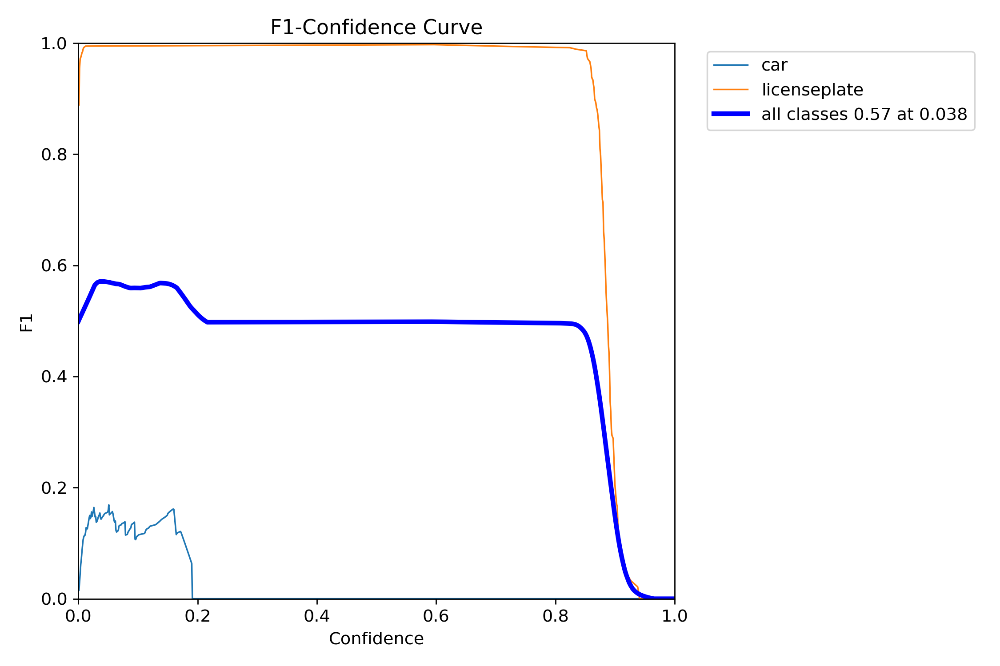

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train4/F1_curve.png', width=600))

### Precision curve

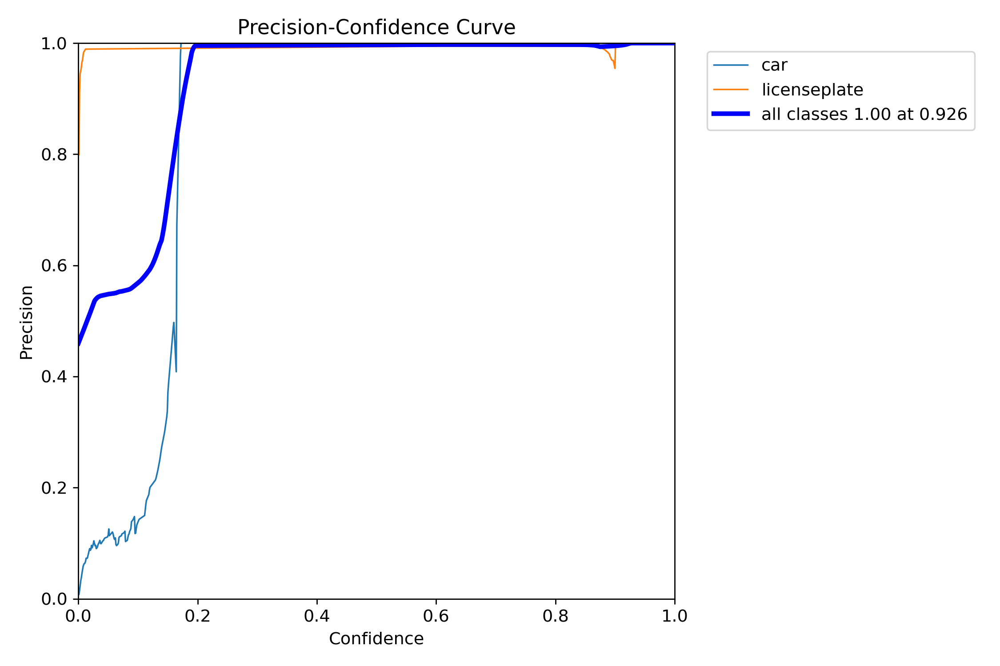

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train4/P_curve.png', width=600))

### Recall curve

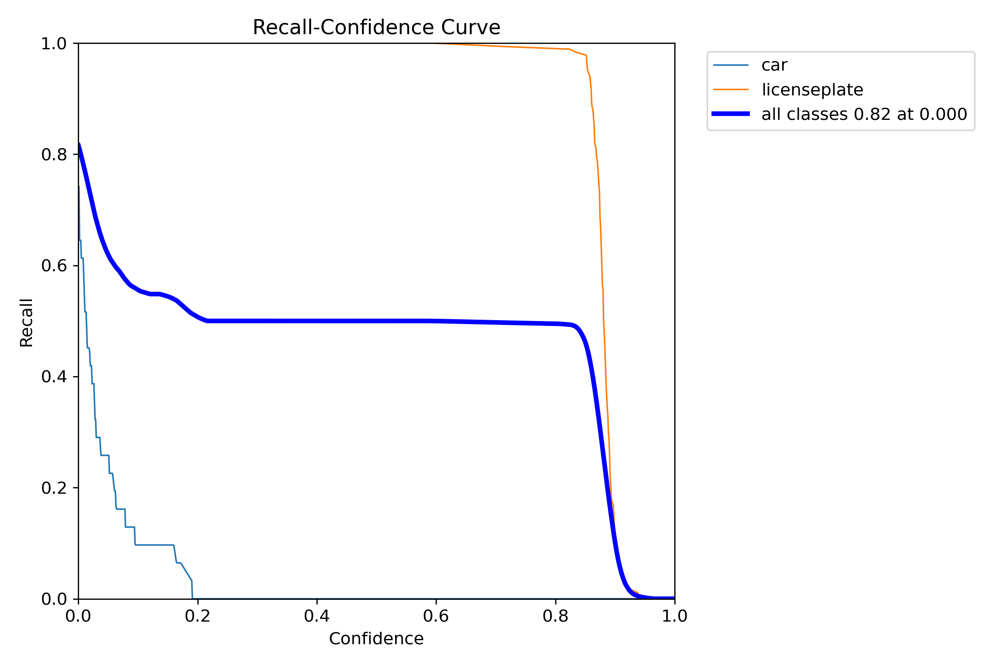

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train4/R_curve.png', width=600))

### Confusion matrix

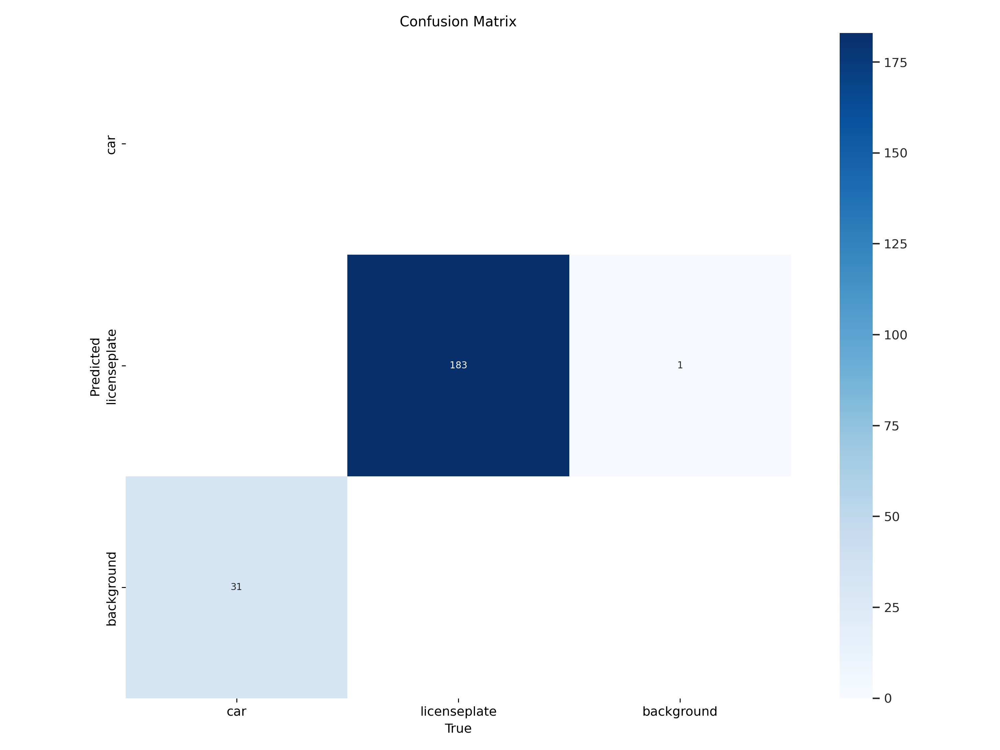

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train4/confusion_matrix.png', width=600))

### results summary

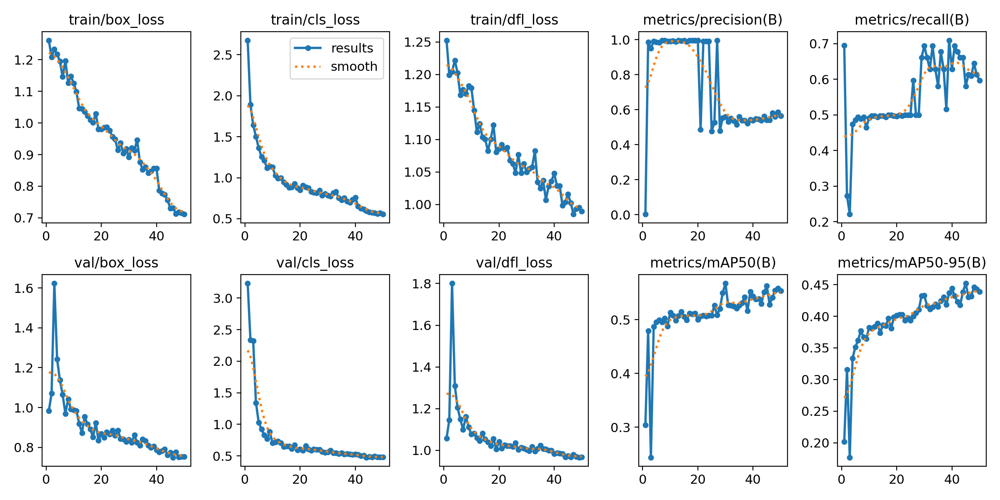

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train4/results.png', width=600))

###  label distribution visualization

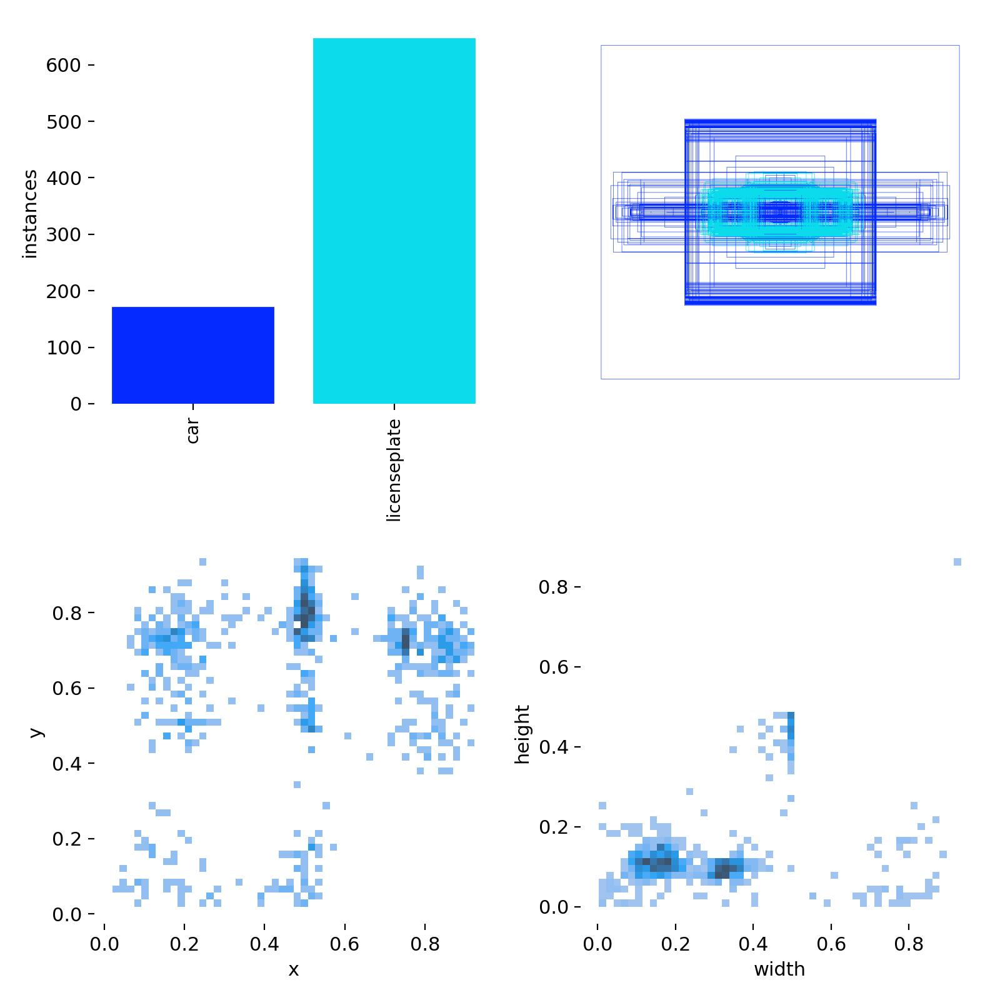

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train4/labels.jpg', width=600))

In [ ]:
# Loading the best-trained YOLO model from my saved weights
best = YOLO("/content/drive/MyDrive/Data/runs/detect/train4/weights/best.pt")

In [ ]:
# Running inference on a test image and saving the predictions as an image and text file
best.predict("/content/drive/MyDrive/Data/test/images/Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg", save = True, save_txt = True)


image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg: 640x640 1 licenseplate, 9.4ms
Speed: 2.8ms preprocess, 9.4ms inference, 205.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict8
1 label saved to runs/detect/predict8/labels


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'car', 1: 'licenseplate'}
 obb: None
 orig_img: array([[[119, 132, 158],
         [130, 143, 169],
         [132, 145, 171],
         ...,
         [  2,  16,  10],
         [ 10,  24,  18],
         [  1,  15,   9]],
 
        [[ 79,  92, 118],
         [ 87, 100, 126],
         [ 92, 105, 131],
         ...,
         [  2,  16,  10],
         [  9,  23,  17],
         [  0,  14,   8]],
 
        [[ 62,  77, 103],
         [ 67,  82, 108],
         [ 74,  89, 115],
         ...,
         [  8,  23,  19],
         [ 12,  27,  23],
         [  4,  19,  15]],
 
        ...,
 
        [[170, 183, 197],
         [181, 194, 208],
         [179, 192, 206],
         ...,
         [138, 158, 176],
         [127, 147, 165],
         [130, 150, 168]],
 
        [[188, 201, 215],
         [201, 214, 228],
         [191, 204, 218],
         ...,
  

###  Predicted Images from YOLO Inference

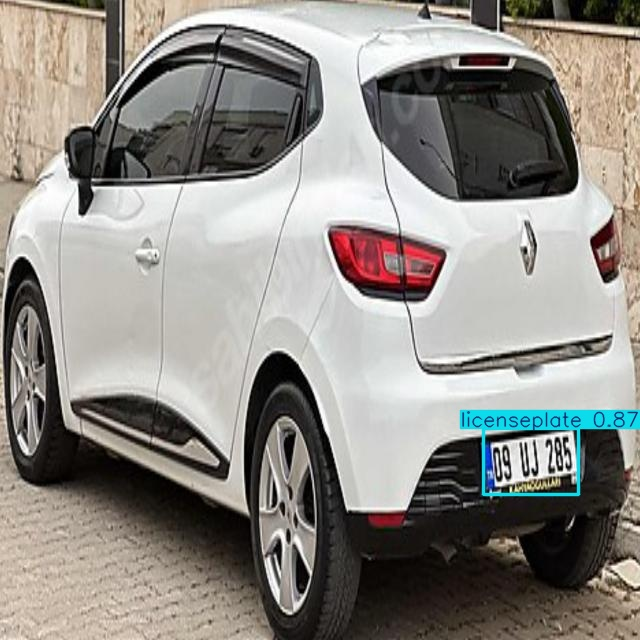

In [ ]:
# Looping through predicted images and displaying them
for image_path in glob.glob('/content/drive/MyDrive/Data/runs/detect/predict8/Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg'):
    display(Image(filename=image_path, width=600))
    print("\n")

### YOLO Prediction on the Test Dataset

In [ ]:
# Running inference on the test dataset using the best-trained YOLO model
!yolo detect predict model="/content/drive/MyDrive/Data/runs/detect/train4/weights/best.pt" conf=0.25 source="/content/drive/MyDrive/Data/test/images" save=True


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/95 /content/drive/MyDrive/Data/test/images/Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg: 640x640 1 licenseplate, 9.8ms
image 2/95 /content/drive/MyDrive/Data/test/images/Screenshot_119_png.rf.724133476b49f19dc0488b5a9415cd88.jpg: 640x640 1 licenseplate, 9.1ms
image 3/95 /content/drive/MyDrive/Data/test/images/Screenshot_132_png.rf.c07b5b1d963bebf19674179f5de55cd4.jpg: 640x640 1 licenseplate, 8.8ms
image 4/95 /content/drive/MyDrive/Data/test/images/Screenshot_135_png.rf.13ac5e89744b52b378b46741d27714b4.jpg: 640x640 1 licenseplate, 9.0ms
image 5/95 /content/drive/MyDrive/Data/test/images/Screenshot_136_png.rf.7c7e20d500ce49d1894701279082deaf.jpg: 640x640 1 licenseplate, 10.5ms
image 6/95 /content/drive/MyDrive/Data/test/images/Screenshot_138_png.rf.fd3d02a50c00102ff794091d8710868d.jpg: 640x640 1 license

### Predicted Image from YOLO Inference

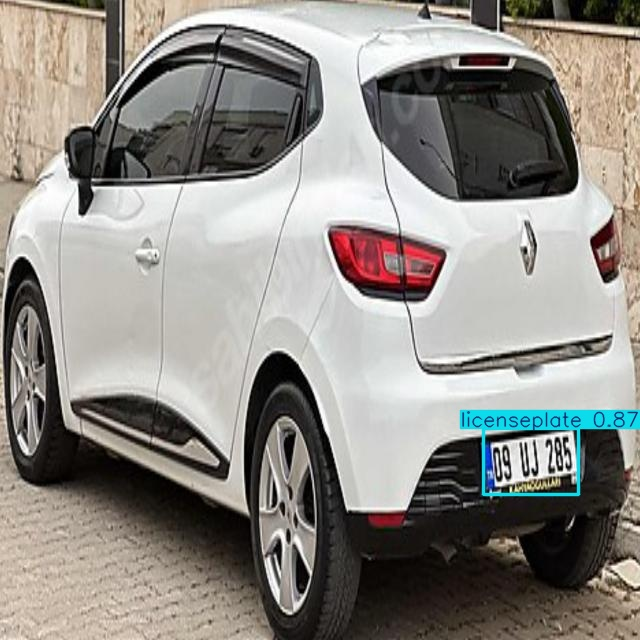

In [ ]:
for image_path in glob.glob('/content/drive/MyDrive/Data/runs/detect/predict8/Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")

### Comparing Custom CNN and YOLO Metrics

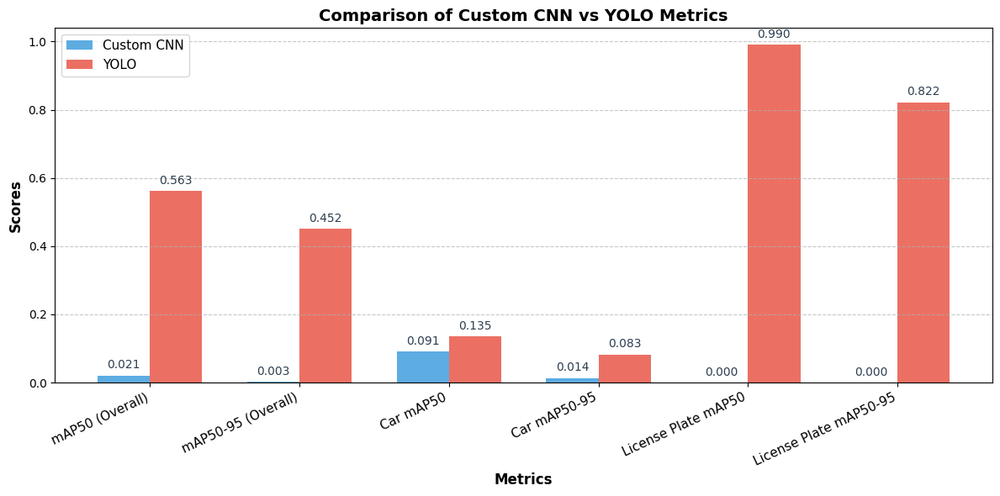

In [ ]:
# Defining the metric labels
metrics = [
    "mAP50 (Overall)", "mAP50-95 (Overall)",
    "Car mAP50", "Car mAP50-95",
    "License Plate mAP50", "License Plate mAP50-95"
]

#  CNN values with my latest results
cnn_values = [
    0.0211, 0.0032,  # Overall mAP
    0.0909, 0.0136,  # Car detection mAP
    0.0000, 0.0000   # License plate detection mAP
]

# Keeping YOLO values unchanged
yolo_values = [
    0.563, 0.452,
    0.135, 0.0826,
    0.99, 0.822
]

# Setting positions for bars
x = np.arange(len(metrics))
bar_width = 0.35  # Width of the bars

# Creating the figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plotting the bars for CNN and YOLO with distinct colors
ax.bar(x - bar_width / 2, cnn_values, bar_width, label="Custom CNN", color="#3498db", alpha=0.8)
ax.bar(x + bar_width / 2, yolo_values, bar_width, label="YOLO", color="#e74c3c", alpha=0.8)

# Adding text labels on top of bars
for i in range(len(metrics)):
    ax.text(x[i] - bar_width / 2, cnn_values[i] + 0.02, f"{cnn_values[i]:.3f}", ha="center", fontsize=10, color="#2c3e50")
    ax.text(x[i] + bar_width / 2, yolo_values[i] + 0.02, f"{yolo_values[i]:.3f}", ha="center", fontsize=10, color="#2c3e50")

# Setting labels and title
ax.set_xlabel("Metrics", fontsize=12, fontweight="bold")
ax.set_ylabel("Scores", fontsize=12, fontweight="bold")
ax.set_title("Comparison of Custom CNN vs YOLO Metrics", fontsize=14, fontweight="bold")
ax.set_xticks(x)
ax.set_xticklabels(metrics, rotation=25, ha="right", fontsize=11)
ax.legend(fontsize=11, loc="upper left")

# Enhancing grid and layout
ax.yaxis.grid(True, linestyle="--", alpha=0.7)
plt.tight_layout()

# Displaying the plot
plt.show()


# Yolo v11 Hyperparameters

In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.8/231.8 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 7.1 MB/s eta 0:00:00


### Hyperparameter Optimization for YOLO Using Optuna

In [ ]:
def objective(trial):
    """
    Defines the objective function for hyperparameter optimization using Optuna.

    This function tunes the learning rate, momentum, and weight decay to optimize
    the YOLO model's performance. The model is trained with the suggested hyperparameters,
    and the mAP50 score is used as the optimization metric.

    Parameters:
    trial (optuna.trial.Trial): An Optuna trial object that suggests hyperparameters.

    Returns:
    float: The mAP50 score from the trained YOLO model.
    """

    # Defining the search space for hyperparameters
    lr = trial.suggest_loguniform('lr', 1e-5, 1e-2)
    momentum = trial.suggest_uniform('momentum', 0.6, 0.95)
    weight_decay = trial.suggest_loguniform('weight_decay', 1e-6, 1e-2)

    # Initializing the YOLO model
    model = YOLO("yolo11n.pt")

    # Training the model with the suggested hyperparameters
    results = model.train(
        data="data.yaml",
        epochs=10,
        batch=16,
        lr0=lr,
        momentum=momentum,
        weight_decay=weight_decay
    )

    # Extracting mAP50 from results correctly
    return results.box.map


# Running the optimization process
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)

# Printing the best-found hyperparameters
print("Best Hyperparameters:", study.best_params)


[I 2025-03-10 16:43:32,728] A new study created in memory with name: no-name-c3c38f8f-39b5-4209-8e9a-eafb9ec85ca1


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001324491685779673' and 'momentum=0.7076071608373545' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=5.034174451061282e-06), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train6
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.35G       1.24      3.079      1.237          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        184        214    0.00322      0.788      0.212      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.27G      1.168      2.112      1.178          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.69it/s]

                   all        184        214       0.99      0.454      0.503      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.25G      1.157      1.853      1.174          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.31it/s]

                   all        184        214      0.985      0.497        0.5      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.26G      1.092      1.608      1.141          7        640: 100%|██████████| 41/41 [00:13<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.26it/s]

                   all        184        214      0.975      0.484      0.503      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.26G      1.049       1.42      1.133          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.40it/s]

                   all        184        214       0.99      0.484      0.505      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.27G      1.022       1.32      1.112          9        640: 100%|██████████| 41/41 [00:13<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.92it/s]

                   all        184        214      0.996      0.495      0.514      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.26G      1.028      1.212      1.104          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.79it/s]

                   all        184        214      0.991        0.5      0.517       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.26G     0.9433      1.133      1.063         11        640: 100%|██████████| 41/41 [00:13<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.66it/s]

                   all        184        214      0.978        0.5      0.518      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.25G      0.904      1.034      1.061          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        184        214      0.987        0.5      0.513      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.27G     0.8859      1.026      1.036          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        184        214      0.484        0.5      0.518      0.404



10 epochs completed in 0.054 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 5.5MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.23it/s]


                   all        184        214      0.484        0.5      0.518      0.404
                   car         27         31          0          0     0.0419     0.0162
          licenseplate        183        183      0.969          1      0.994      0.792
Speed: 0.4ms preprocess, 5.0ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to runs/detect/train6


[I 2025-03-10 16:47:07,014] Trial 0 finished with value: 0.40396784354237836 and parameters: {'lr': 0.001324491685779673, 'momentum': 0.7076071608373545, 'weight_decay': 5.034174451061282e-06}. Best is trial 0 with value: 0.40396784354237836.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0018342280813396649' and 'momentum=0.8756294307449448' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00014488098747363903), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train7
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.41G      1.235      3.078      1.233          9        640: 100%|██████████| 41/41 [00:19<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.30it/s]

                   all        184        214    0.00333      0.796      0.333      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.26G       1.17      2.103      1.195          9        640: 100%|██████████| 41/41 [00:16<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]

                   all        184        214      0.963      0.374      0.447      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.27G       1.16       1.85      1.171          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        184        214      0.972      0.461      0.492      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.25G       1.12      1.657      1.158          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.66it/s]

                   all        184        214      0.993      0.495      0.498      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.27G      1.053       1.42      1.124          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]

                   all        184        214      0.993      0.492       0.53      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.27G      1.076      1.337      1.135          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.36it/s]

                   all        184        214      0.984      0.494      0.496       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.27G     0.9911      1.184      1.094          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.60it/s]

                   all        184        214      0.995      0.494      0.518      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.25G     0.9468      1.129       1.07         11        640: 100%|██████████| 41/41 [00:16<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.48it/s]

                   all        184        214      0.489      0.497      0.509      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.27G     0.9034       1.04      1.064          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.97it/s]

                   all        184        214      0.987        0.5      0.525      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.27G     0.9048      1.022      1.049          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.61it/s]

                   all        184        214      0.514      0.516      0.514      0.399



10 epochs completed in 0.056 hours.
Optimizer stripped from runs/detect/train7/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train7/weights/best.pt, 5.5MB

Validating runs/detect/train7/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.11s/it]


                   all        184        214      0.987        0.5      0.525      0.404
                   car         27         31          1          0     0.0576     0.0211
          licenseplate        183        183      0.974          1      0.992      0.787
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms loss, 9.2ms postprocess per image
Results saved to runs/detect/train7


[I 2025-03-10 16:50:49,450] Trial 1 finished with value: 0.40397126802837313 and parameters: {'lr': 0.0018342280813396649, 'momentum': 0.8756294307449448, 'weight_decay': 0.00014488098747363903}. Best is trial 1 with value: 0.40397126802837313.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.007745850351878492' and 'momentum=0.9255444581949979' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0007702799318936572), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train8
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       2.5G      1.243      3.093      1.243          9        640: 100%|██████████| 41/41 [00:19<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.22it/s]

                   all        184        214    0.00322      0.795      0.368       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.26G       1.17      2.149      1.183          9        640: 100%|██████████| 41/41 [00:16<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.64it/s]

                   all        184        214      0.972      0.366      0.478      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.27G      1.147      1.847      1.179          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        184        214      0.966      0.473      0.485      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.25G       1.11      1.611      1.157          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.80it/s]

                   all        184        214      0.994      0.489      0.504       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.26G       1.04      1.405      1.131          7        640: 100%|██████████| 41/41 [00:13<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.67it/s]

                   all        184        214      0.991      0.495      0.501      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.26G      1.047      1.281      1.126          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.61it/s]

                   all        184        214      0.995      0.497      0.519      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.26G      1.004      1.194      1.116          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.71it/s]

                   all        184        214      0.505      0.581      0.522      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.27G     0.9385      1.105      1.064         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.81it/s]

                   all        184        214      0.503      0.518      0.519        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.26G     0.8941      1.022      1.064          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.82it/s]

                   all        184        214      0.527      0.516      0.522      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.26G     0.8954      1.022      1.051          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]

                   all        184        214      0.506      0.516      0.511      0.401



10 epochs completed in 0.056 hours.
Optimizer stripped from runs/detect/train8/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train8/weights/best.pt, 5.5MB

Validating runs/detect/train8/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.01s/it]


                   all        184        214      0.527      0.516      0.522      0.409
                   car         27         31     0.0729     0.0323     0.0518     0.0264
          licenseplate        183        183      0.982          1      0.993      0.791
Speed: 0.4ms preprocess, 4.8ms inference, 0.0ms loss, 11.1ms postprocess per image
Results saved to runs/detect/train8


[I 2025-03-10 16:54:31,854] Trial 2 finished with value: 0.40856705020850503 and parameters: {'lr': 0.007745850351878492, 'momentum': 0.9255444581949979, 'weight_decay': 0.0007702799318936572}. Best is trial 2 with value: 0.40856705020850503.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=2.5682261958003726e-05' and 'momentum=0.8960349914822825' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=1.0047910610811996e-05), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train9
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.41G       1.24      3.079      1.237          9        640: 100%|██████████| 41/41 [00:18<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.18it/s]

                   all        184        214    0.00322      0.788      0.212      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.27G      1.168      2.112      1.178          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        184        214       0.99      0.454      0.503      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.26G      1.157      1.853      1.174          9        640: 100%|██████████| 41/41 [00:13<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]

                   all        184        214      0.985      0.497        0.5      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.27G      1.092      1.608      1.141          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.64it/s]

                   all        184        214      0.975      0.484      0.503      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.28G      1.049       1.42      1.133          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

                   all        184        214       0.99      0.484      0.505      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.27G      1.022       1.32      1.112          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.93it/s]

                   all        184        214      0.996      0.495      0.514      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.27G      1.028      1.212      1.104          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.65it/s]

                   all        184        214      0.991        0.5      0.517       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.25G     0.9433      1.133      1.063         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.47it/s]

                   all        184        214      0.978        0.5      0.518      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.27G      0.904      1.034      1.061          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.27it/s]

                   all        184        214      0.987        0.5      0.513      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.27G     0.8859      1.026      1.036          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.47it/s]

                   all        184        214      0.484        0.5      0.518      0.404



10 epochs completed in 0.055 hours.
Optimizer stripped from runs/detect/train9/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train9/weights/best.pt, 5.5MB

Validating runs/detect/train9/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.01s/it]


                   all        184        214      0.484        0.5      0.518      0.404
                   car         27         31          0          0     0.0419     0.0162
          licenseplate        183        183      0.969          1      0.994      0.792
Speed: 0.3ms preprocess, 4.9ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to runs/detect/train9


[I 2025-03-10 16:58:11,074] Trial 3 finished with value: 0.40396784354237836 and parameters: {'lr': 2.5682261958003726e-05, 'momentum': 0.8960349914822825, 'weight_decay': 1.0047910610811996e-05}. Best is trial 2 with value: 0.40856705020850503.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=1.561253656691325e-05' and 'momentum=0.7128421241711207' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0003915233930723715), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train10
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.41G      1.237      3.066      1.239          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.89it/s]

                   all        184        214    0.00335       0.79      0.441      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.26G      1.171      2.156      1.177          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.59it/s]

                   all        184        214          1      0.209      0.485      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.27G      1.157      1.898      1.165          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.34it/s]

                   all        184        214      0.982      0.481      0.497      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.25G      1.102      1.637      1.133          7        640: 100%|██████████| 41/41 [00:21<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]

                   all        184        214      0.993      0.484        0.5      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.27G      1.038      1.424      1.132          7        640: 100%|██████████| 41/41 [00:15<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.48it/s]

                   all        184        214      0.995      0.489      0.499      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.27G      1.034      1.321      1.116          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.12it/s]

                   all        184        214      0.994        0.5      0.503      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.27G      1.001      1.191      1.088          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.67it/s]

                   all        184        214      0.997        0.5      0.509      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.25G     0.9492      1.125      1.058         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

                   all        184        214      0.997        0.5      0.506      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.27G     0.9124      1.038       1.06          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.75it/s]

                   all        184        214      0.997        0.5      0.515      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.27G     0.8919      1.049      1.037          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]

                   all        184        214      0.485        0.5      0.512      0.396



10 epochs completed in 0.059 hours.
Optimizer stripped from runs/detect/train10/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train10/weights/best.pt, 5.5MB

Validating runs/detect/train10/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:08<00:00,  1.34s/it]


                   all        184        214      0.997        0.5      0.515      0.398
                   car         27         31          1          0     0.0392     0.0151
          licenseplate        183        183      0.994          1      0.991      0.781
Speed: 0.3ms preprocess, 4.6ms inference, 0.0ms loss, 14.2ms postprocess per image
Results saved to runs/detect/train10


[I 2025-03-10 17:02:06,524] Trial 4 finished with value: 0.3980705446804705 and parameters: {'lr': 1.561253656691325e-05, 'momentum': 0.7128421241711207, 'weight_decay': 0.0003915233930723715}. Best is trial 2 with value: 0.40856705020850503.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train11, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train11/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0030060822341485384' and 'momentum=0.8171666931135572' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=1.3563803948191351e-05), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train11
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.41G       1.24      3.079      1.237          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]

                   all        184        214    0.00322      0.788      0.212      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.26G      1.168      2.112      1.178          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.71it/s]

                   all        184        214       0.99      0.454      0.503      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.27G      1.157      1.853      1.174          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

                   all        184        214      0.985      0.497        0.5      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.25G      1.092      1.608      1.141          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]


                   all        184        214      0.975      0.484      0.503      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.26G      1.049       1.42      1.133          7        640: 100%|██████████| 41/41 [00:13<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.95it/s]

                   all        184        214       0.99      0.484      0.505      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.26G      1.022       1.32      1.112          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        184        214      0.996      0.495      0.514      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.26G      1.028      1.212      1.104          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.89it/s]

                   all        184        214      0.991        0.5      0.517       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.27G     0.9433      1.133      1.063         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.77it/s]

                   all        184        214      0.978        0.5      0.518      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.28G      0.904      1.034      1.061          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.49it/s]

                   all        184        214      0.987        0.5      0.513      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.26G     0.8859      1.026      1.036          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        184        214      0.484        0.5      0.518      0.404



10 epochs completed in 0.054 hours.
Optimizer stripped from runs/detect/train11/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train11/weights/best.pt, 5.5MB

Validating runs/detect/train11/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.13s/it]


                   all        184        214      0.484        0.5      0.518      0.404
                   car         27         31          0          0     0.0419     0.0162
          licenseplate        183        183      0.969          1      0.994      0.792
Speed: 0.3ms preprocess, 3.8ms inference, 0.0ms loss, 12.2ms postprocess per image
Results saved to runs/detect/train11


[I 2025-03-10 17:05:42,199] Trial 5 finished with value: 0.40396784354237836 and parameters: {'lr': 0.0030060822341485384, 'momentum': 0.8171666931135572, 'weight_decay': 1.3563803948191351e-05}. Best is trial 2 with value: 0.40856705020850503.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train12, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=2.045099012049546e-05' and 'momentum=0.6324732029383291' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=1.0046389639791364e-05), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train12
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.41G       1.24      3.079      1.237          9        640: 100%|██████████| 41/41 [00:19<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.59it/s]

                   all        184        214    0.00322      0.788      0.212      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.26G      1.168      2.112      1.178          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        184        214       0.99      0.454      0.503      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.26G      1.157      1.853      1.174          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.86it/s]

                   all        184        214      0.985      0.497        0.5      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.27G      1.092      1.608      1.141          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        184        214      0.975      0.484      0.503      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.26G      1.049       1.42      1.133          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

                   all        184        214       0.99      0.484      0.505      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.27G      1.022       1.32      1.112          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.34it/s]

                   all        184        214      0.996      0.495      0.514      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.26G      1.028      1.212      1.104          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.84it/s]

                   all        184        214      0.991        0.5      0.517       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.27G     0.9433      1.133      1.063         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]

                   all        184        214      0.978        0.5      0.518      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.26G      0.904      1.034      1.061          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        184        214      0.987        0.5      0.513      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.27G     0.8859      1.026      1.036          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.79it/s]

                   all        184        214      0.484        0.5      0.518      0.404



10 epochs completed in 0.055 hours.
Optimizer stripped from runs/detect/train12/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train12/weights/best.pt, 5.5MB

Validating runs/detect/train12/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.14it/s]


                   all        184        214      0.484        0.5      0.518      0.404
                   car         27         31          0          0     0.0419     0.0162
          licenseplate        183        183      0.969          1      0.994      0.792
Speed: 0.3ms preprocess, 4.1ms inference, 0.0ms loss, 10.3ms postprocess per image
Results saved to runs/detect/train12


[I 2025-03-10 17:09:20,971] Trial 6 finished with value: 0.40396784354237836 and parameters: {'lr': 2.045099012049546e-05, 'momentum': 0.6324732029383291, 'weight_decay': 1.0046389639791364e-05}. Best is trial 2 with value: 0.40856705020850503.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train13, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train13/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00010919094208705865' and 'momentum=0.8106638959967847' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00433649759730926), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train13
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.39G       1.24      3.102      1.224          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.23it/s]

                   all        184        214    0.00335       0.79      0.467      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.26G      1.163      2.113      1.188          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.82it/s]

                   all        184        214      0.992      0.177      0.479       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.27G      1.143      1.826      1.177          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.74it/s]


                   all        184        214      0.983      0.469      0.495      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.26G      1.118      1.598      1.198          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        184        214      0.982      0.475      0.498      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.27G      1.061       1.42      1.185          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.62it/s]

                   all        184        214      0.992      0.499      0.518      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.27G      1.064      1.323      1.161          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.36it/s]

                   all        184        214      0.995      0.493      0.541      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.27G      1.005      1.206      1.138          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        184        214      0.985        0.5      0.558      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.26G     0.9419      1.114      1.103         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.90it/s]

                   all        184        214      0.994      0.497      0.501      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.27G     0.9075       1.03      1.092          7        640: 100%|██████████| 41/41 [00:15<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

                   all        184        214      0.592      0.516      0.555      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.27G     0.8854      1.025      1.069          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.22it/s]

                   all        184        214      0.986        0.5      0.526       0.41



10 epochs completed in 0.056 hours.
Optimizer stripped from runs/detect/train13/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train13/weights/best.pt, 5.5MB

Validating runs/detect/train13/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


                   all        184        214      0.588      0.516      0.555      0.415
                   car         27         31      0.199     0.0323      0.121     0.0512
          licenseplate        183        183      0.976          1       0.99      0.779
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms loss, 7.3ms postprocess per image
Results saved to runs/detect/train13


[I 2025-03-10 17:13:00,743] Trial 7 finished with value: 0.4149521234063055 and parameters: {'lr': 0.00010919094208705865, 'momentum': 0.8106638959967847, 'weight_decay': 0.00433649759730926}. Best is trial 7 with value: 0.4149521234063055.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train14, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train14/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0014691603981959976' and 'momentum=0.8962067789723731' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=1.2833139343209655e-05), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train14
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.41G       1.24      3.079      1.237          9        640: 100%|██████████| 41/41 [00:16<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.58it/s]

                   all        184        214    0.00322      0.788      0.212      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.26G      1.168      2.112      1.178          9        640: 100%|██████████| 41/41 [00:15<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        184        214       0.99      0.454      0.503      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.27G      1.157      1.853      1.174          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.56it/s]

                   all        184        214      0.985      0.497        0.5      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.26G      1.092      1.608      1.141          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.59it/s]

                   all        184        214      0.975      0.484      0.503      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.26G      1.049       1.42      1.133          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]

                   all        184        214       0.99      0.484      0.505      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.26G      1.022       1.32      1.112          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]

                   all        184        214      0.996      0.495      0.514      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.26G      1.028      1.212      1.104          9        640: 100%|██████████| 41/41 [00:16<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.86it/s]

                   all        184        214      0.991        0.5      0.517       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.27G     0.9433      1.133      1.063         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.66it/s]

                   all        184        214      0.978        0.5      0.518      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.26G      0.904      1.034      1.061          7        640: 100%|██████████| 41/41 [00:15<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]

                   all        184        214      0.987        0.5      0.513      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.26G     0.8859      1.026      1.036          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.37it/s]

                   all        184        214      0.484        0.5      0.518      0.404



10 epochs completed in 0.057 hours.
Optimizer stripped from runs/detect/train14/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train14/weights/best.pt, 5.5MB

Validating runs/detect/train14/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:08<00:00,  1.42s/it]


                   all        184        214      0.484        0.5      0.518      0.404
                   car         27         31          0          0     0.0419     0.0162
          licenseplate        183        183      0.969          1      0.994      0.792
Speed: 0.4ms preprocess, 7.5ms inference, 0.0ms loss, 9.7ms postprocess per image
Results saved to runs/detect/train14


[I 2025-03-10 17:16:55,982] Trial 8 finished with value: 0.40396784354237836 and parameters: {'lr': 0.0014691603981959976, 'momentum': 0.8962067789723731, 'weight_decay': 1.2833139343209655e-05}. Best is trial 7 with value: 0.4149521234063055.


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train15, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/drive/MyDrive/Data/train/labels.cache... 647 images, 1 backgrounds, 0 corrupt: 100%|██████████| 647/647 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train15/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.003617039584325748' and 'momentum=0.9453357019938098' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=8.438226417336128e-05), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train15
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.41G       1.24      3.075      1.237          9        640: 100%|██████████| 41/41 [00:18<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        184        214    0.00321      0.785      0.159      0.097



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.27G      1.177      2.117      1.187          9        640: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.23it/s]

                   all        184        214      0.964     0.0956      0.437      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.26G       1.14      1.842      1.201          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.62it/s]

                   all        184        214      0.976      0.475      0.497      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.27G      1.087      1.629      1.168          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        184        214      0.987      0.493      0.512      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.27G      1.073      1.437      1.175          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        184        214      0.997      0.492      0.502      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.27G      1.053      1.292      1.144          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]

                   all        184        214      0.996      0.497      0.516      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.27G       1.04      1.217      1.131          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        184        214      0.997      0.497      0.524      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.25G     0.9434      1.114      1.094         11        640: 100%|██████████| 41/41 [00:14<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.61it/s]

                   all        184        214      0.983        0.5      0.513       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.28G     0.9047      1.034       1.08          7        640: 100%|██████████| 41/41 [00:14<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.65it/s]

                   all        184        214      0.976        0.5       0.53      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.27G     0.8908      1.009      1.057          9        640: 100%|██████████| 41/41 [00:14<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.49it/s]

                   all        184        214       0.48        0.5      0.515      0.404



10 epochs completed in 0.056 hours.
Optimizer stripped from runs/detect/train15/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train15/weights/best.pt, 5.5MB

Validating runs/detect/train15/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:08<00:00,  1.48s/it]


                   all        184        214      0.976        0.5       0.53      0.408
                   car         27         31          1          0     0.0663      0.033
          licenseplate        183        183      0.952          1      0.993      0.783
Speed: 0.5ms preprocess, 5.4ms inference, 0.0ms loss, 12.9ms postprocess per image
Results saved to runs/detect/train15


[I 2025-03-10 17:20:42,576] Trial 9 finished with value: 0.40805651021585065 and parameters: {'lr': 0.003617039584325748, 'momentum': 0.9453357019938098, 'weight_decay': 8.438226417336128e-05}. Best is trial 7 with value: 0.4149521234063055.


Best Hyperparameters: {'lr': 0.00010919094208705865, 'momentum': 0.8106638959967847, 'weight_decay': 0.00433649759730926}


# After Optimization

In [ ]:
labels = [line.split()[0] for file in glob.glob("train/labels/*.txt") for line in open(file)]
print("Class Distribution:", Counter(labels))


Class Distribution: Counter({'1': 646, '0': 170})


### Undersampling Overrepresented Classes

In [ ]:
def undersample_class(source_folder, keep_ratio=0.5):
    """
    Reduces the number of images in an overrepresented class by randomly removing a percentage of images.

    This function selects a subset of images to keep based on the specified ratio
    and removes the rest to balance class distribution.

    Parameters:
    source_folder (str): Path to the folder containing images of the overrepresented class.
    keep_ratio (float): The proportion of images to retain (default is 0.5, meaning 50% retention).

    Returns:
    None
    """

    # Retrieving all images from the specified folder
    images = glob.glob(os.path.join(source_folder, "*.jpg"))

    # Calculating the number of images to remove
    remove_count = int(len(images) * (1 - keep_ratio))

    # Randomly selecting images to delete
    for img in random.sample(images, remove_count):
        os.remove(img)  # Deleting images


# Reducing the number of license plate images by 30%
undersample_class("train/images/plates", keep_ratio=0.7)


### Applying Data Augmentation to Training Images

In [ ]:
# Defining the augmentation pipeline
transform = A.Compose([
    A.RandomBrightnessContrast(p=0.3),  # Adjusting brightness and contrast
    A.HorizontalFlip(p=0.5),            # Flipping images horizontally
    A.Rotate(limit=15, p=0.3),          # Rotating images within a 15-degree range
    A.Blur(blur_limit=3, p=0.1)         # Applying slight blurring
])

def augment_image(image_path):
    """
    Applies data augmentation to an image and saves the augmented version.

    This function reads an image, applies predefined transformations, and saves
    the augmented image with a modified filename.

    Parameters:
    image_path (str): Path to the image file.

    Returns:
    None
    """

    # Loading the image
    image = cv2.imread(image_path)

    # Applying transformations
    augmented = transform(image=image)['image']

    # Saving the augmented image with a new filename
    cv2.imwrite(image_path.replace(".jpg", "_aug.jpg"), augmented)


# Looping through training images and applying augmentation
for img in glob.glob("train/images/*.jpg"):
    augment_image(img)


In [ ]:


# Load YOLOv11 model
model = YOLO("yolo11n.pt")

# Training using best hyperparameters
model.train(
    data="/content/drive/MyDrive/Data/data.yaml",  # Data config with hyperameters
    epochs=50,
    batch=32,
    lr0=0.000109,
    momentum=0.810,
    weight_decay=0.0043,
    optimizer="AdamW",
    plots=True
)


100%|██████████| 5.35M/5.35M [00:00<00:00, 71.2MB/s]


Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/Data/data.yaml, epochs=50, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

train: Scanning /content/drive/MyDrive/Data/train/labels... 647 images, 1295 backgrounds, 0 corrupt: 100%|██████████| 1941/1941 [00:14<00:00, 129.50it/s]


train: New cache created: /content/drive/MyDrive/Data/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 644, len(boxes) = 816. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/Data/valid/labels.cache... 184 images, 1 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 164, len(boxes) = 214. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.000109, momentum=0.81) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0043), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.37G      1.275      3.011      1.278         14        640: 100%|██████████| 61/61 [00:47<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]

                   all        184        214    0.00181      0.258    0.00237   0.000737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.31G       1.12      1.971      1.173         10        640: 100%|██████████| 61/61 [00:42<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.16it/s]

                   all        184        214      0.384      0.704      0.496      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.31G      1.068      1.927      1.135         30        640: 100%|██████████| 61/61 [00:43<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.34it/s]

                   all        184        214       0.99      0.495      0.501      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       4.3G     0.9931      1.781      1.093         13        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.22it/s]

                   all        184        214      0.993      0.497      0.513      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.31G     0.9817      1.682      1.075         18        640: 100%|██████████| 61/61 [00:42<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.17it/s]

                   all        184        214      0.997      0.496      0.511      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       4.3G     0.9658      1.705      1.075         11        640: 100%|██████████| 61/61 [00:42<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.28s/it]

                   all        184        214      0.487        0.5       0.54      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.31G     0.9675      1.724      1.074          5        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]

                   all        184        214      0.978        0.5      0.523      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       4.3G     0.9558      1.671      1.082         16        640: 100%|██████████| 61/61 [00:43<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.12it/s]

                   all        184        214      0.488        0.5      0.505      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.31G     0.9046      1.619      1.043          5        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.01s/it]

                   all        184        214      0.996      0.495      0.514        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       4.3G     0.9065      1.611       1.06          9        640: 100%|██████████| 61/61 [00:40<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.29it/s]

                   all        184        214      0.983      0.492      0.503      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.31G      0.971      1.624      1.086         10        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.20it/s]

                   all        184        214      0.518      0.534      0.518      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       4.3G     0.9026       1.58      1.054          9        640: 100%|██████████| 61/61 [00:41<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.05it/s]

                   all        184        214        0.6      0.516      0.521      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.31G      0.893      1.544      1.036         10        640: 100%|██████████| 61/61 [00:41<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.44it/s]

                   all        184        214      0.994        0.5      0.518      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       4.3G     0.9073      1.489      1.042          8        640: 100%|██████████| 61/61 [00:42<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

                   all        184        214       0.56      0.513       0.53      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.31G     0.8938      1.517      1.037          9        640: 100%|██████████| 61/61 [00:40<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.16s/it]

                   all        184        214      0.525      0.546      0.514      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       4.3G     0.8888      1.437      1.034          6        640: 100%|██████████| 61/61 [00:41<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.34it/s]

                   all        184        214      0.514      0.548      0.535      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.31G     0.8709      1.419      1.035          8        640: 100%|██████████| 61/61 [00:41<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.06it/s]

                   all        184        214      0.524      0.548      0.519      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       4.3G     0.8707      1.448      1.026         20        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.19s/it]

                   all        184        214      0.696      0.519      0.541      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.31G     0.8589      1.414      1.027          8        640: 100%|██████████| 61/61 [00:43<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.24it/s]

                   all        184        214      0.569      0.543      0.545       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       4.3G     0.8539       1.39      1.023         13        640: 100%|██████████| 61/61 [00:41<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.17it/s]

                   all        184        214      0.587      0.556      0.541       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.31G     0.8289      1.353      1.013          8        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.08it/s]

                   all        184        214      0.522      0.562       0.53      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       4.3G     0.8494      1.348      1.023         10        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.15it/s]

                   all        184        214      0.505      0.562      0.513      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.31G     0.8313      1.375      1.017         13        640: 100%|██████████| 61/61 [00:42<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.25it/s]

                   all        184        214      0.575      0.527      0.521      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       4.3G     0.8514      1.394      1.029         17        640: 100%|██████████| 61/61 [00:44<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.24it/s]

                   all        184        214       0.53       0.53      0.539      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.31G     0.8478      1.347      1.024         10        640: 100%|██████████| 61/61 [00:43<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.05it/s]

                   all        184        214      0.527      0.565      0.526      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       4.3G     0.8338       1.37      1.014          9        640: 100%|██████████| 61/61 [00:42<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.14s/it]

                   all        184        214      0.542      0.527      0.518      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.31G     0.8371       1.33      1.013         16        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.29it/s]

                   all        184        214      0.528       0.53       0.53      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       4.3G       0.82      1.304      1.016         22        640: 100%|██████████| 61/61 [11:28<00:00, 11.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.10it/s]

                   all        184        214      0.582      0.565      0.518      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.34G     0.8084      1.316      1.001         13        640: 100%|██████████| 61/61 [00:41<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.24it/s]

                   all        184        214      0.534      0.559      0.513       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       4.3G     0.8304      1.298      1.004         17        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.15it/s]

                   all        184        214      0.635      0.546      0.549      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.31G     0.8335      1.341      1.015         16        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.02s/it]

                   all        184        214      0.544      0.543      0.519       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       4.3G      0.774      1.317     0.9927         22        640: 100%|██████████| 61/61 [00:41<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]

                   all        184        214      0.542      0.532      0.519      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.31G     0.7863      1.284      0.991         16        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.14it/s]

                   all        184        214      0.608      0.527      0.523      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       4.3G     0.7768      1.255      1.008          9        640: 100%|██████████| 61/61 [00:41<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.33it/s]

                   all        184        214      0.582      0.526      0.522       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.34G     0.8022      1.252      1.004          9        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.08it/s]

                   all        184        214      0.522      0.524      0.528      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       4.3G     0.7538      1.219      0.988          9        640: 100%|██████████| 61/61 [00:42<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.00s/it]

                   all        184        214      0.519      0.559      0.514      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.31G     0.7371      1.241      0.984         15        640: 100%|██████████| 61/61 [00:40<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]

                   all        184        214      0.525      0.629      0.533      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       4.3G     0.7283      1.214     0.9717         11        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.33it/s]

                   all        184        214      0.543      0.594      0.516      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.31G     0.7596      1.227     0.9892         15        640: 100%|██████████| 61/61 [00:41<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.32it/s]

                   all        184        214      0.535      0.562       0.52      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       4.3G     0.7542      1.182     0.9752         10        640: 100%|██████████| 61/61 [00:41<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.18it/s]

                   all        184        214      0.541      0.594      0.517       0.42


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.31G      0.713      1.174     0.9814          7        640: 100%|██████████| 61/61 [00:44<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.24it/s]

                   all        184        214      0.564       0.53      0.519      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       4.3G      0.676      1.125     0.9729         10        640: 100%|██████████| 61/61 [00:39<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.26it/s]

                   all        184        214      0.539      0.642      0.538      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.31G     0.6852      1.113     0.9808          6        640: 100%|██████████| 61/61 [00:39<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.17it/s]

                   all        184        214       0.53      0.594      0.528      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       4.3G     0.6694      1.091     0.9598         11        640: 100%|██████████| 61/61 [00:39<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.03s/it]

                   all        184        214      0.538      0.562      0.524       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.33G     0.6567      1.072     0.9596          4        640: 100%|██████████| 61/61 [00:39<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.28it/s]

                   all        184        214      0.594       0.53       0.53      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       4.3G     0.6655      1.109     0.9637          8        640: 100%|██████████| 61/61 [00:41<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.29it/s]

                   all        184        214      0.709       0.53      0.534      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.31G     0.6519      1.063     0.9509          9        640: 100%|██████████| 61/61 [00:39<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.08it/s]

                   all        184        214      0.718       0.53       0.53      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       4.3G     0.6334      1.045     0.9377          6        640: 100%|██████████| 61/61 [00:39<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.14it/s]

                   all        184        214      0.608       0.53      0.528      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.31G     0.6429      1.085     0.9489          8        640: 100%|██████████| 61/61 [00:38<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.01s/it]

                   all        184        214      0.541      0.546      0.524      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       4.3G      0.639      1.077     0.9572          8        640: 100%|██████████| 61/61 [00:39<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.34it/s]

                   all        184        214      0.606       0.53      0.525      0.424



50 epochs completed in 0.826 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.86 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.29s/it]


                   all        184        214      0.569      0.543      0.545       0.43
                   car         27         31      0.144     0.0968     0.0962     0.0513
          licenseplate        183        183      0.995      0.989      0.993      0.809
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b027a8fafd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
# Loading the best-trained YOLO model from my saved weights
best = YOLO("/content/drive/MyDrive/Data/runs/detect/train15/weights/best.pt")


In [ ]:
# Running inference on a test image and saving the predictions as an image and text file
best.predict("/content/drive/MyDrive/Data/test/images/Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg", save = True, save_txt = True)



image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg: 640x640 1 licenseplate, 10.6ms
Speed: 10.2ms preprocess, 10.6ms inference, 341.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
1 label saved to runs/detect/predict2/labels


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'car', 1: 'licenseplate'}
 obb: None
 orig_img: array([[[119, 132, 158],
         [130, 143, 169],
         [132, 145, 171],
         ...,
         [  2,  16,  10],
         [ 10,  24,  18],
         [  1,  15,   9]],
 
        [[ 79,  92, 118],
         [ 87, 100, 126],
         [ 92, 105, 131],
         ...,
         [  2,  16,  10],
         [  9,  23,  17],
         [  0,  14,   8]],
 
        [[ 62,  77, 103],
         [ 67,  82, 108],
         [ 74,  89, 115],
         ...,
         [  8,  23,  19],
         [ 12,  27,  23],
         [  4,  19,  15]],
 
        ...,
 
        [[170, 183, 197],
         [181, 194, 208],
         [179, 192, 206],
         ...,
         [138, 158, 176],
         [127, 147, 165],
         [130, 150, 168]],
 
        [[188, 201, 215],
         [201, 214, 228],
         [191, 204, 218],
         ...,
  

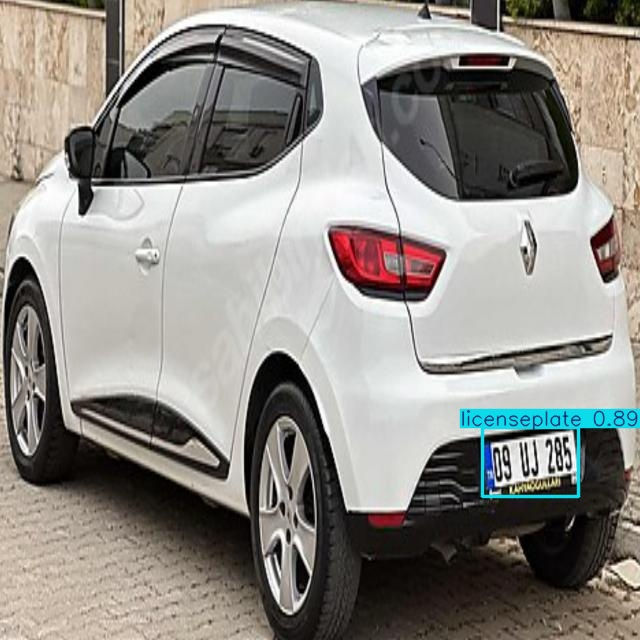

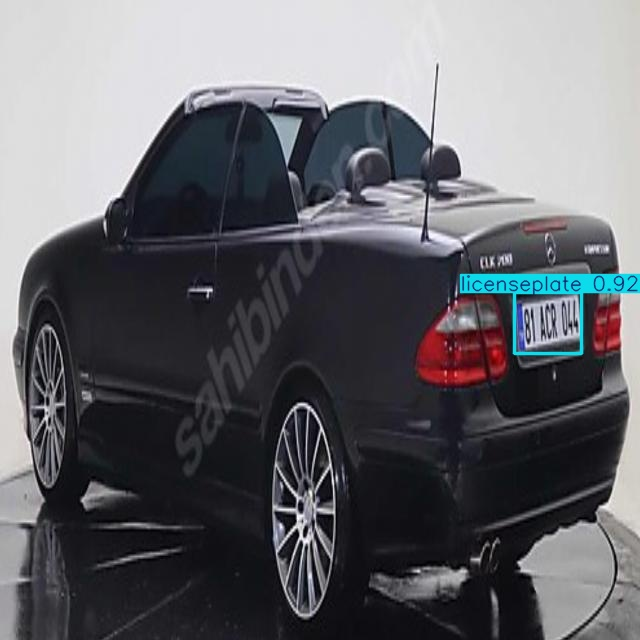

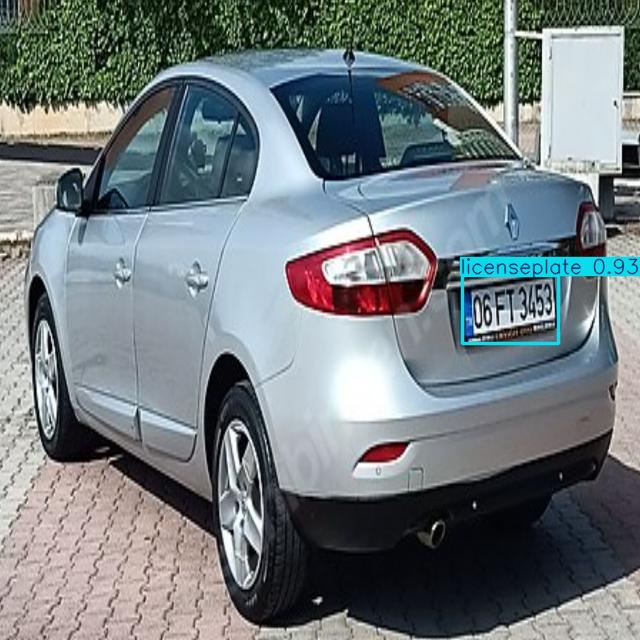

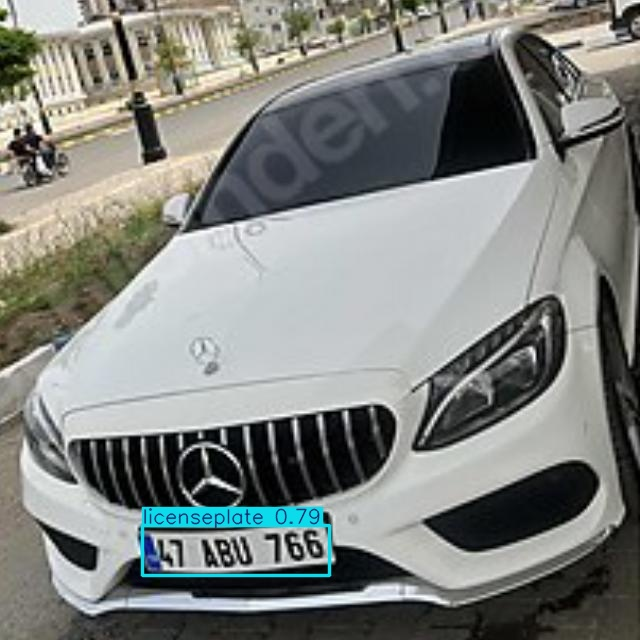

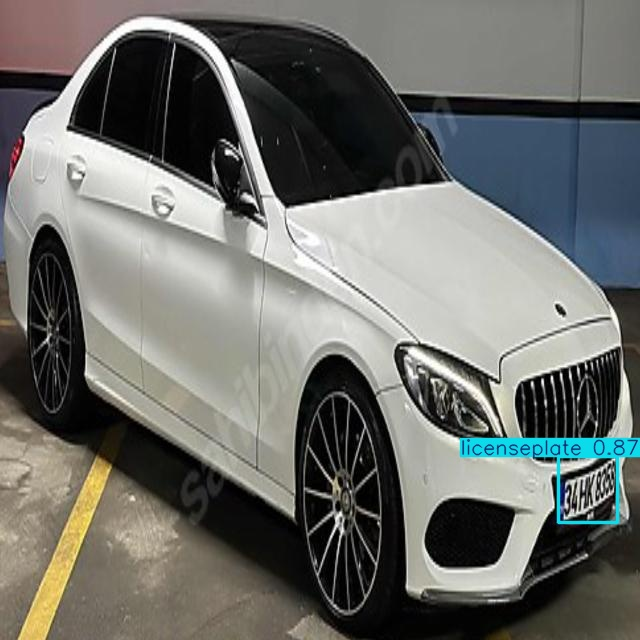

...

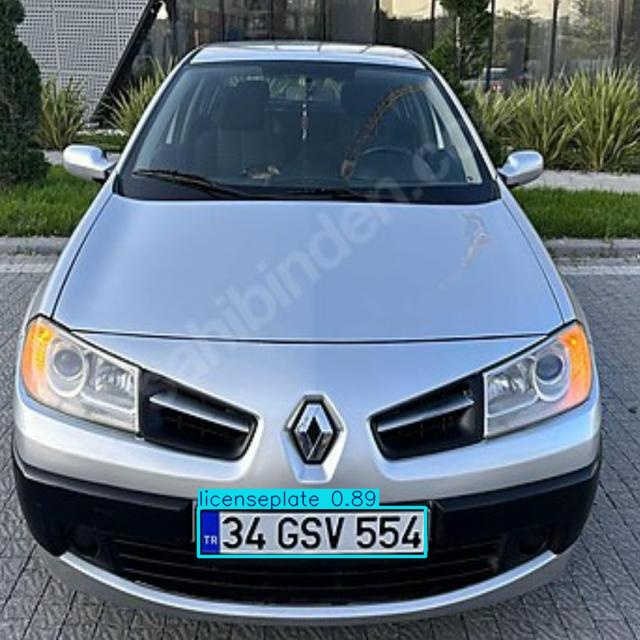

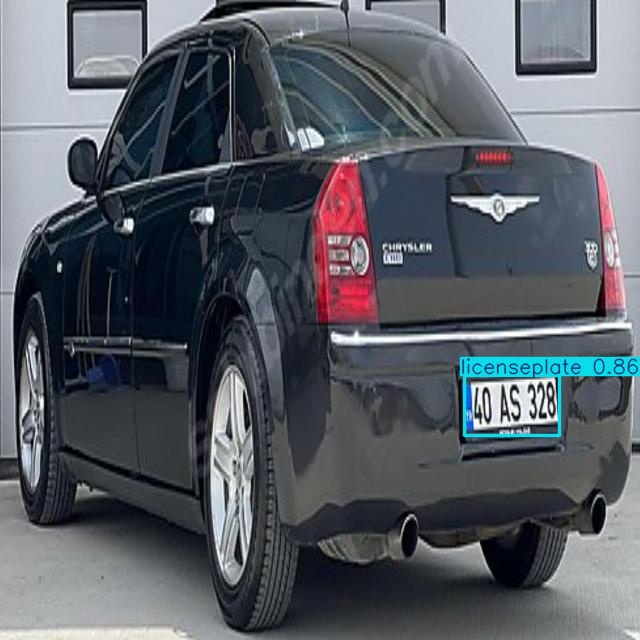

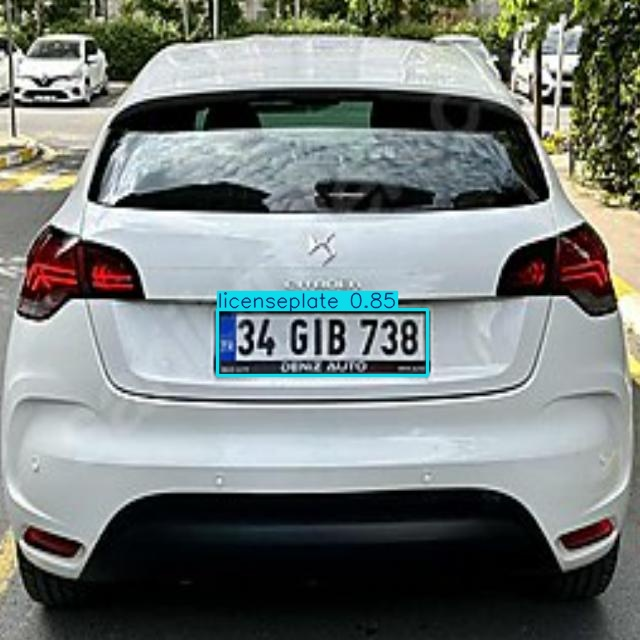

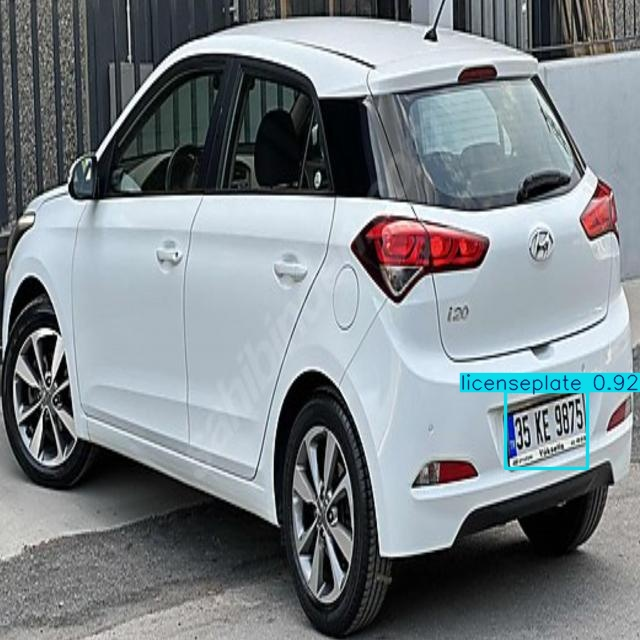

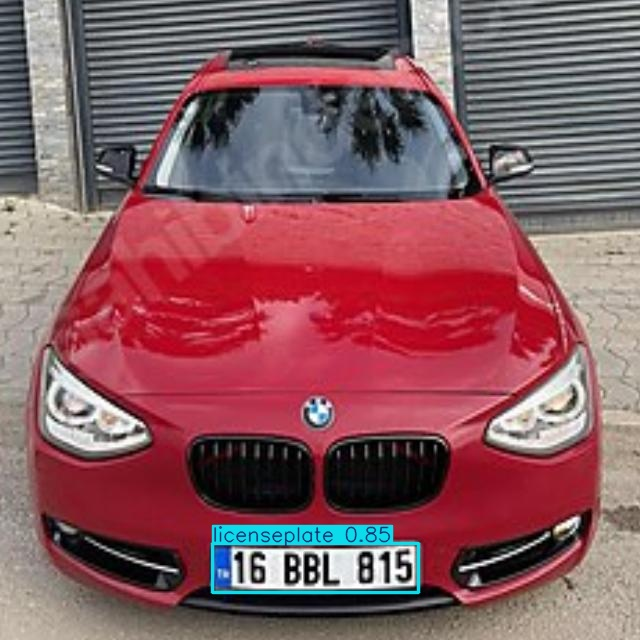

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display
latest_folder = max(glob.glob('/content/drive/MyDrive/Data/runs/detect/predict2'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg'):
    display(IPyImage(filename=img, width=600))

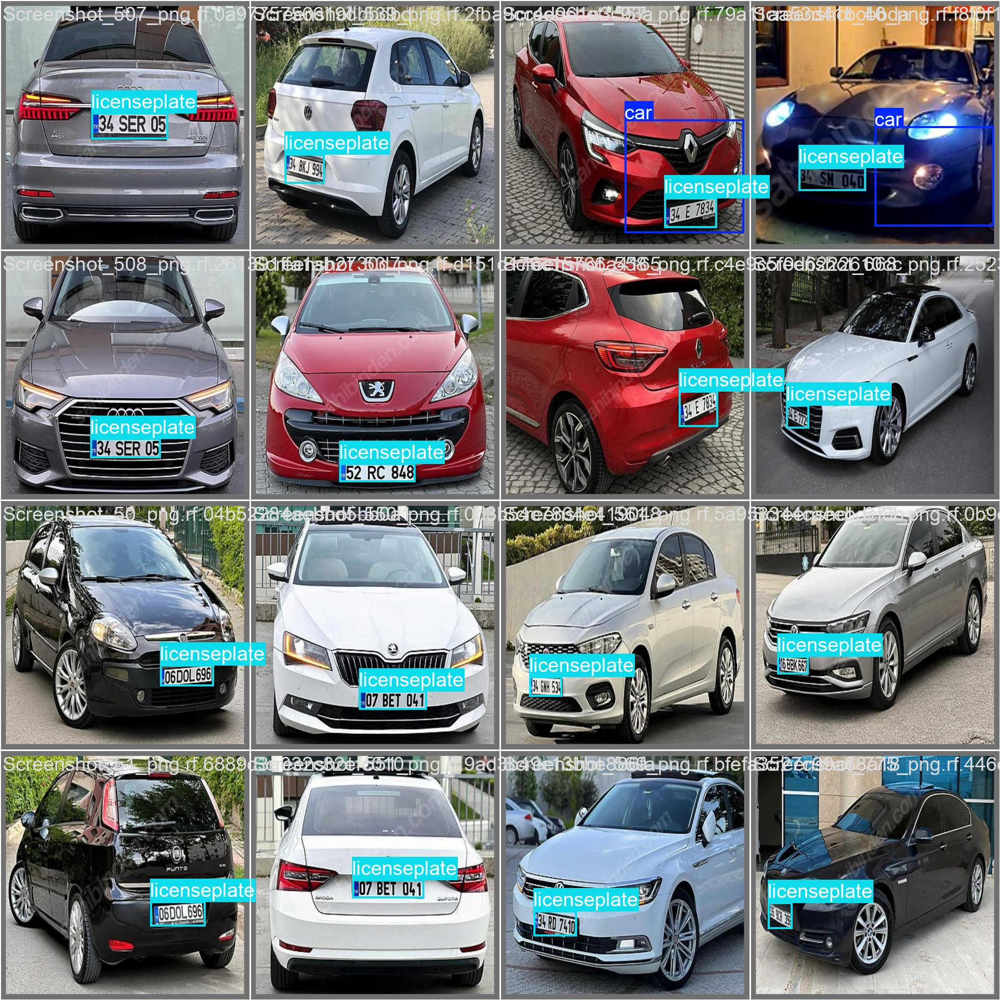

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train/val_batch1_labels.jpg', width=600))

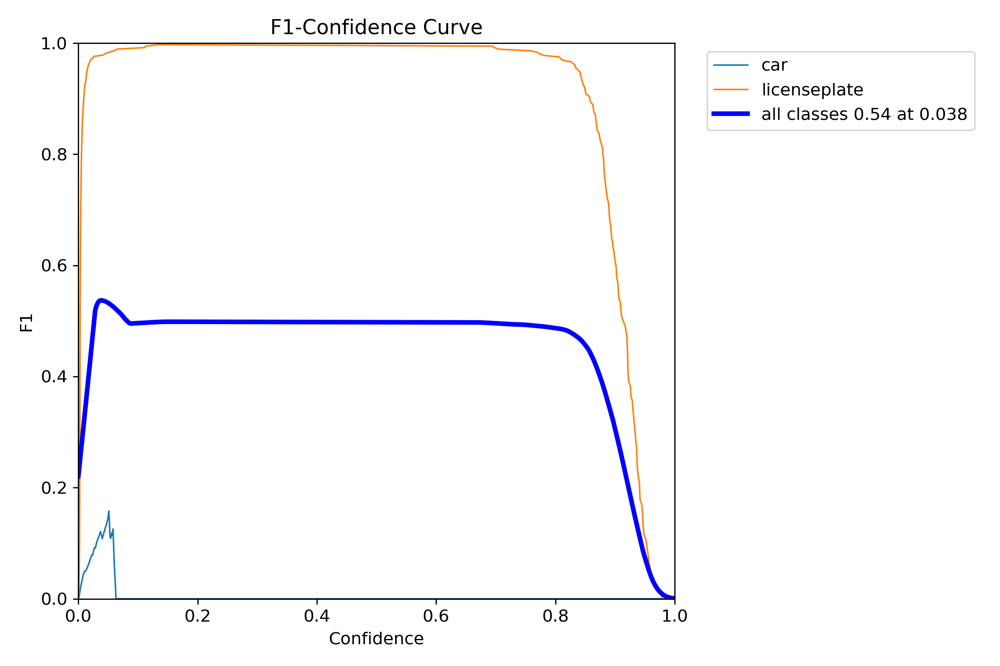

In [ ]:
from IPython.display import Image,display
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train/F1_curve.png', width=600))

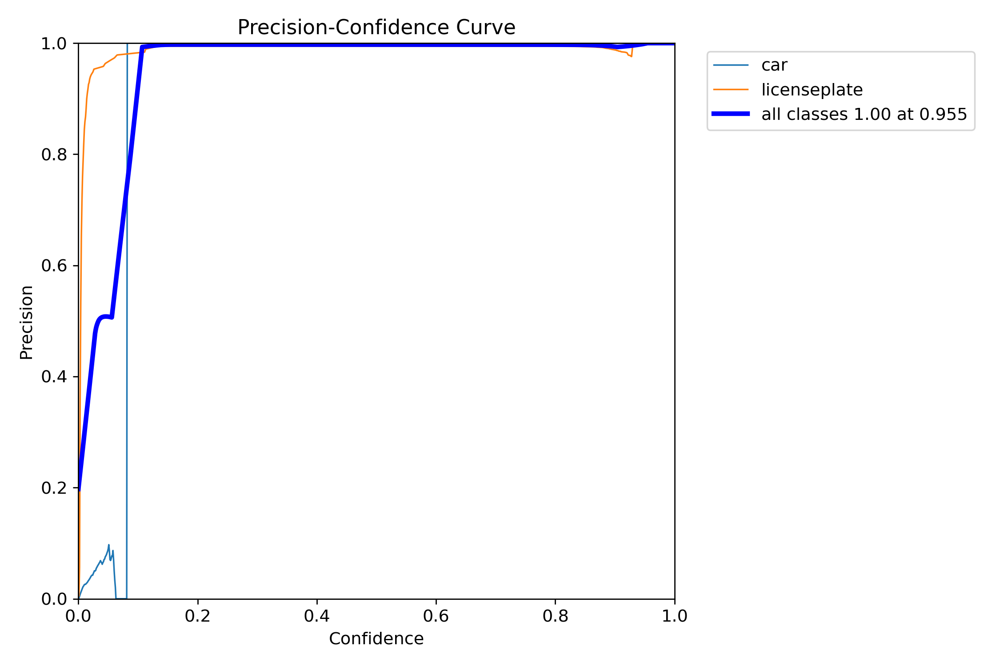

In [ ]:
from IPython.display import Image,display
display(Image(filename= '/content/drive/MyDrive/Data/runs/detect/train/P_curve.png', width=600))

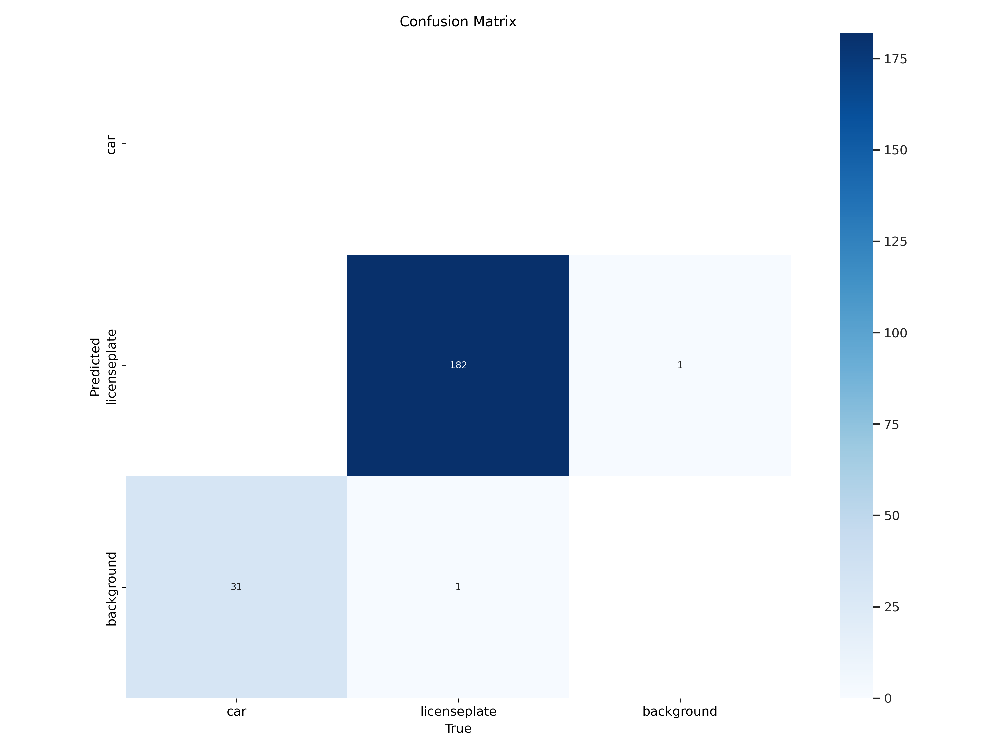

In [ ]:
from IPython.display import Image,display
display(Image(filename= '/content/drive/MyDrive/Data/runs/detect/train/confusion_matrix.png', width=600))

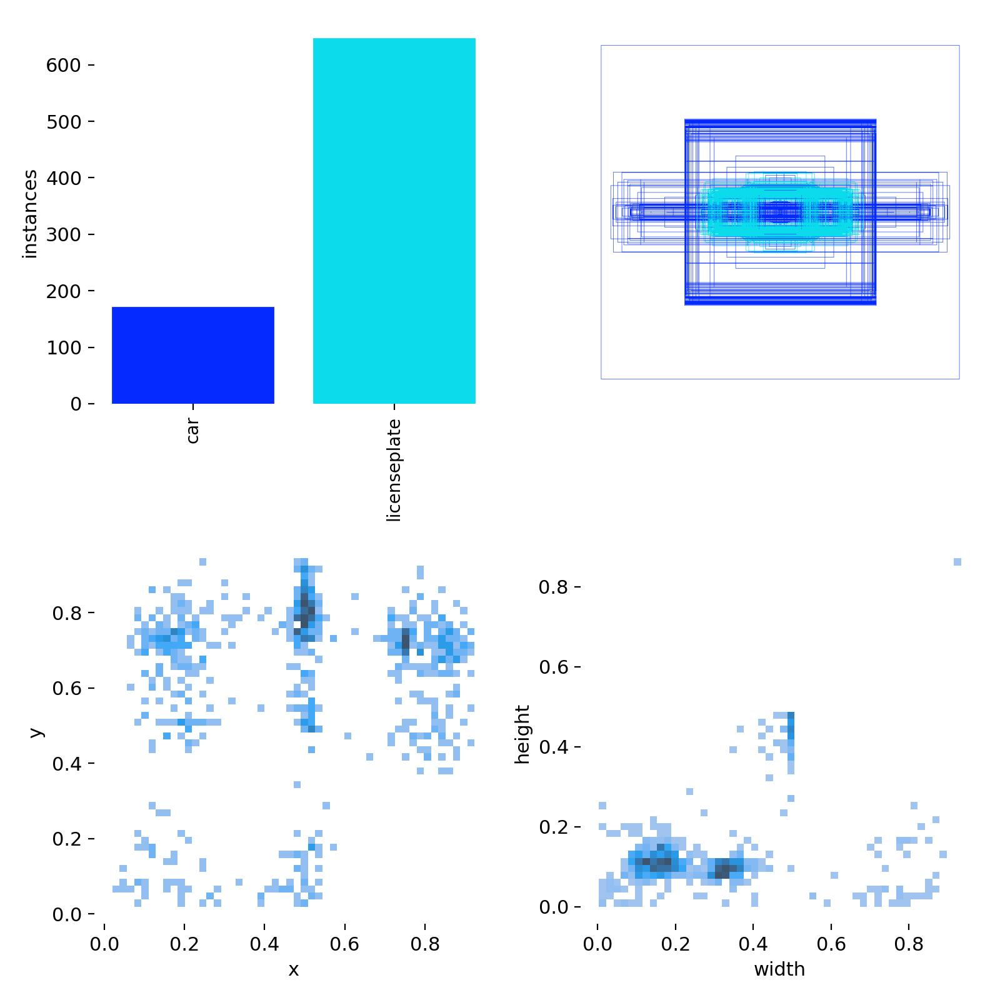

In [ ]:
from IPython.display import Image,display
display(Image(filename= '/content/drive/MyDrive/Data/runs/detect/train/labels.jpg', width=600))

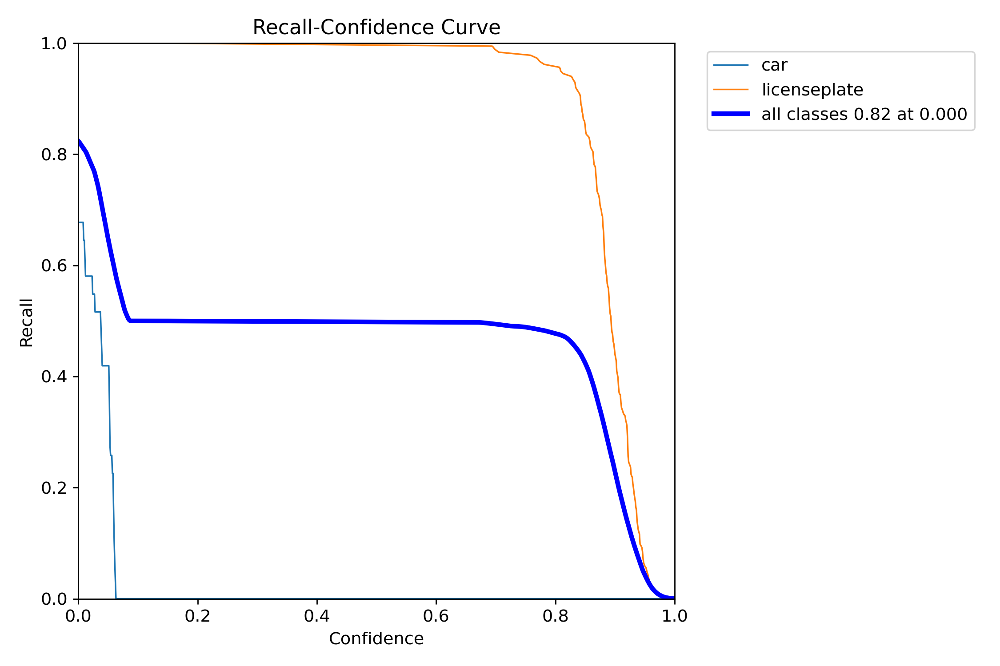

In [ ]:
from IPython.display import Image,display
display(Image(filename= '/content/drive/MyDrive/Data/runs/detect/train/R_curve.png', width=600))

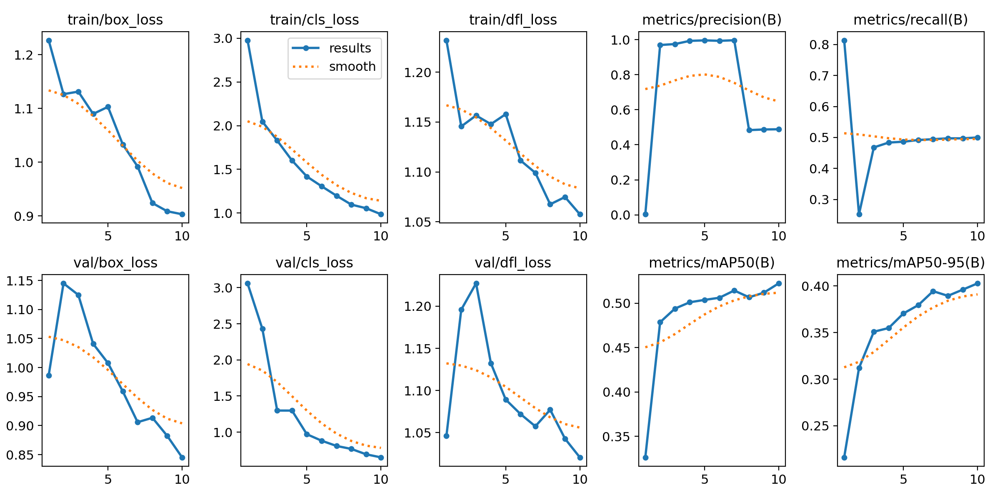

In [ ]:
display(Image(filename='/content/drive/MyDrive/Data/runs/detect/train/results.png', width=600))

# overall results

# **OCR Models : Pytessaract , Easy OCR**

In [ ]:
!pip install opencv-python-headless
!sudo apt-get install tesseract-ocr
!pip install pytesseract


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 29 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,916 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
import pytesseract
pytesseract.pytesseract.tesseract_cmd = r'/usr/bin/tesseract'


In [ ]:
pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.9/422.9 kB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 969.6/969.6 kB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.9/292.9 kB 28.4 MB/s eta 0:00:00


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete
🔍 Processing: /content/drive/MyDrive/Data/test/images/Screenshot_132_png.rf.c07b5b1d963bebf19674179f5de55cd4.jpg

image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_132_png.rf.c07b5b1d963bebf19674179f5de55cd4.jpg: 640x640 1 licenseplate, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

🔍 Processing: /content/drive/MyDrive/Data/test/images/Screenshot_319_png.rf.1d75418f8957c3d8d1562cfaa802b81a.jpg

image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_319_png.rf.1d75418f8957c3d8d1562cfaa802b81a.jpg: 640x640 1 licenseplate, 18.4ms
Speed: 5.1ms preprocess, 18.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

🔍 Processing: /content/drive/MyDrive/Data/test/images/Screenshot_684_png.rf.29de9c7f235cf52477e8c416e2ad809c.jpg

image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_684_png.rf.29de9c7f235cf52477e8c416e2ad8

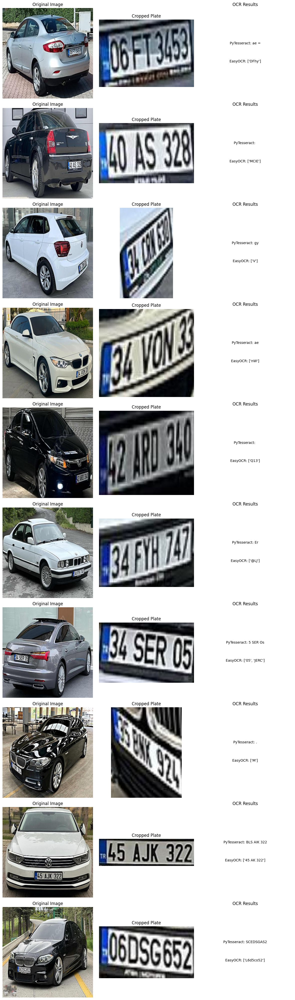

In [ ]:

# Loading trained YOLO model
model_path = "/content/drive/MyDrive/Data/runs/detect/train/weights/best.pt"
model = YOLO(model_path)

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])

# Path to YOLO test images
test_images_folder = "/content/drive/MyDrive/Data/test/images"
output_folder = "/content/drive/MyDrive/Data/test"  # Folder to save cropped plates
os.makedirs(output_folder, exist_ok=True)

# Function to preprocess the license plate image
def preprocess_plate(image):
    """Enhances contrast and applies thresholding for OCR."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return binary

# Function to extract text from a license plate image
def extract_text(image):
    """Extracts text using PyTesseract & EasyOCR after preprocessing."""
    processed_image = preprocess_plate(image)

    # Extract text using PyTesseract
    pytesseract_text = pytesseract.image_to_string(processed_image, config='--psm 7').strip()

    # Extract text using EasyOCR
    easyocr_text = reader.readtext(processed_image, detail=0)

    return pytesseract_text, easyocr_text

# Function to detect, crop, and apply OCR on detected license plates
def detect_and_extract_text(image_path):
    """Runs YOLO, crops detected plates, applies OCR, and returns results."""
    # Load image
    img = cv2.imread(image_path)

    # Run YOLO detection
    results = model.predict(image_path, save=False)

    detected_plates = []
    for result in results:
        for i, box in enumerate(result.boxes.xyxy):
            x1, y1, x2, y2 = map(int, box)  # Convert box coordinates to integers
            cropped_plate = img[y1:y2, x1:x2]  # Crop license plate region

            # Apply OCR
            pytesseract_text, easyocr_text = extract_text(cropped_plate)

            # Store result
            detected_plates.append({
                "Image": image_path,
                "Cropped Plate": cropped_plate,
                "PyTesseract OCR": pytesseract_text,
                "EasyOCR OCR": easyocr_text
            })

    return detected_plates

# Selecting a random sample of 5-10 images from the test folder
num_samples = 10
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith((".jpg", ".png", ".jpeg"))]
sample_images = np.random.choice(test_images, min(num_samples, len(test_images)), replace=False)

# Process selected images and display results
fig, axes = plt.subplots(len(sample_images), 3, figsize=(12, 4 * len(sample_images)))

for idx, image_path in enumerate(sample_images):
    print(f"\n🔍 Processing: {image_path}")
    results = detect_and_extract_text(image_path)

    if results:
        original_img = cv2.imread(image_path)
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

        # Display original image
        axes[idx, 0].imshow(original_img)
        axes[idx, 0].set_title("Original Image")
        axes[idx, 0].axis("off")

        for res in results:
            cropped_img = res["Cropped Plate"]
            pytesseract_text = res["PyTesseract OCR"]
            easyocr_text = res["EasyOCR OCR"]

            # Display cropped plate
            axes[idx, 1].imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
            axes[idx, 1].set_title("Cropped Plate")
            axes[idx, 1].axis("off")

            # Display OCR results
            axes[idx, 2].text(0.5, 0.6, f"PyTesseract: {pytesseract_text}", fontsize=10, ha="center")
            axes[idx, 2].text(0.5, 0.4, f"EasyOCR: {easyocr_text}", fontsize=10, ha="center")
            axes[idx, 2].set_title("OCR Results")
            axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
pip install opencv-python-headless pytesseract easyocr numpy matplotlib difflib Levenshtein


ERROR: Could not find a version that satisfies the requirement difflib (from versions: none)
ERROR: No matching distribution found for difflib



🔍 Processing: /content/drive/MyDrive/Data/test/images/Screenshot_8_png.rf.3e3fe3c8e91fa2c81072eb5f042d41a8.jpg

image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_8_png.rf.3e3fe3c8e91fa2c81072eb5f042d41a8.jpg: 640x640 1 licenseplate, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

🔍 Processing: /content/drive/MyDrive/Data/test/images/Screenshot_707_png.rf.bc0bb8991b2e7d8d0073c7330b096f67.jpg

image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_707_png.rf.bc0bb8991b2e7d8d0073c7330b096f67.jpg: 640x640 1 licenseplate, 9.9ms
Speed: 1.9ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

🔍 Processing: /content/drive/MyDrive/Data/test/images/Screenshot_722_png.rf.0c04709ded28140d76b085a4425e9933.jpg

image 1/1 /content/drive/MyDrive/Data/test/images/Screenshot_722_png.rf.0c04709ded28140d76b085a4425e9933.jpg: 640x640 1 licenseplate, 11.6ms
Speed: 2.2ms preprocess, 11.6ms inference, 1

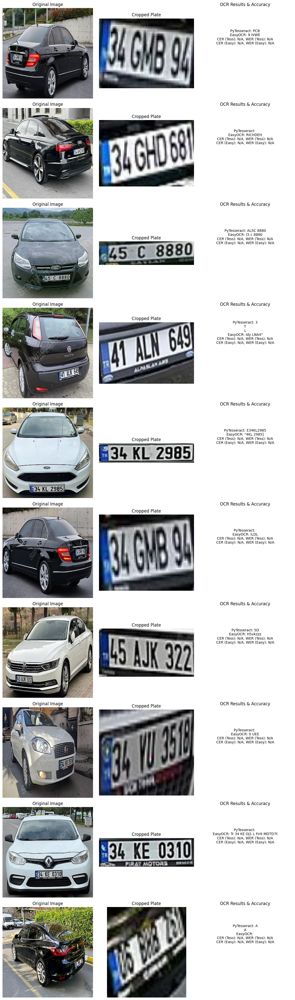

In [ ]:
import os
import cv2
import pytesseract
import easyocr
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import Levenshtein

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])

# Function to preprocess license plates for OCR
def preprocess_plate(image):
    """Enhances contrast, reduces noise, and sharpens edges."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Check brightness level (to avoid over-processing)
    mean_brightness = np.mean(gray)
    if mean_brightness < 90:
        # Apply CLAHE only if image is too dark
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
        gray = clahe.apply(gray)

    # Apply Otsu's Thresholding for binarization
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Sharpen image to make edges clear
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened = cv2.filter2D(binary, -1, kernel)

    return sharpened

# Function to compute OCR accuracy
def compute_accuracy(predicted, actual):
    """Calculates Character Error Rate (CER) and Word Error Rate (WER)."""
    if not actual or not predicted:
        return "N/A", "N/A"

    cer = Levenshtein.distance(predicted, actual) / max(len(actual), 1)
    wer = Levenshtein.distance(predicted.split(), actual.split()) / max(len(actual.split()), 1)

    return round(cer, 4), round(wer, 4)

# Function to perform OCR
def extract_text(image):
    """Extracts text using PyTesseract and EasyOCR after preprocessing."""
    processed = preprocess_plate(image)

    # Resize to improve OCR accuracy
    resized = cv2.resize(processed, (processed.shape[1] * 2, processed.shape[0] * 2))

    # PyTesseract OCR
    tess_text = pytesseract.image_to_string(
        resized, config='--psm 6 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
    ).strip()

    # EasyOCR
    easy_text = reader.readtext(resized, detail=0)

    return tess_text, " ".join(easy_text)

# Function to detect plates and extract text
def detect_and_extract_text(image_path, ground_truth=None):
    """Detects license plates using YOLO, extracts text, and compares accuracy."""
    img = cv2.imread(image_path)

    # Run YOLO detection
    results = model.predict(image_path, save=False)

    detected_plates = []
    for result in results:
        for box in result.boxes.xyxy:
            x1, y1, x2, y2 = map(int, box)
            cropped_plate = img[y1:y2, x1:x2]

            # Skip empty detections
            if cropped_plate.shape[0] == 0 or cropped_plate.shape[1] == 0:
                continue

            # Apply OCR
            pytesseract_text, easyocr_text = extract_text(cropped_plate)

            # Compare accuracy if ground truth available
            if ground_truth:
                cer_tess, wer_tess = compute_accuracy(pytesseract_text, ground_truth)
                cer_easy, wer_easy = compute_accuracy(easyocr_text, ground_truth)
            else:
                cer_tess, wer_tess, cer_easy, wer_easy = "N/A", "N/A", "N/A", "N/A"

            # Store results
            detected_plates.append({
                "Image": os.path.basename(image_path),
                "Cropped Plate": cropped_plate,
                "PyTesseract OCR": pytesseract_text,
                "EasyOCR OCR": easyocr_text,
                "CER (Tesseract)": cer_tess,
                "WER (Tesseract)": wer_tess,
                "CER (EasyOCR)": cer_easy,
                "WER (EasyOCR)": wer_easy
            })

    return detected_plates

# Sample ground truth dictionary (for accuracy comparison)
ground_truth_dict = {
    "Screenshot_107_png.rf.55856b4ec91833fb780ffa8398b10e64.jpg": "09 UJ 285",
    "Screenshot_119_png.rf.724133476b49f19dc0488b5a9415cd88.jpg": "81 ACR 044",
    "Screenshot_132_png.rf.c07b5b1d963bebf19674179f5de55cd4.jpg": "06FT3453",
}

# Select random sample of 5-10 images
num_samples = 10
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith((".jpg", ".png", ".jpeg"))]
sample_images = np.random.choice(test_images, min(num_samples, len(test_images)), replace=False)

# Process images & display results
fig, axes = plt.subplots(len(sample_images), 3, figsize=(12, 4 * len(sample_images)))

for idx, image_path in enumerate(sample_images):
    print(f"\n🔍 Processing: {image_path}")
    ground_truth = ground_truth_dict.get(os.path.basename(image_path), None)
    results = detect_and_extract_text(image_path, ground_truth)

    if results:
        original_img = cv2.imread(image_path)
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

        # Display original image
        axes[idx, 0].imshow(original_img)
        axes[idx, 0].set_title("Original Image")
        axes[idx, 0].axis("off")

        for res in results:
            cropped_img = res["Cropped Plate"]
            pytesseract_text = res["PyTesseract OCR"]
            easyocr_text = res["EasyOCR OCR"]
            cer_tess = res["CER (Tesseract)"]
            wer_tess = res["WER (Tesseract)"]
            cer_easy = res["CER (EasyOCR)"]
            wer_easy = res["WER (EasyOCR)"]

            # Display cropped plate
            axes[idx, 1].imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
            axes[idx, 1].set_title("Cropped Plate")
            axes[idx, 1].axis("off")

            # Display OCR results & Accuracy
            text = f"PyTesseract: {pytesseract_text}\nEasyOCR: {easyocr_text}\nCER (Tess): {cer_tess}, WER (Tess): {wer_tess}\nCER (Easy): {cer_easy}, WER (Easy): {wer_easy}"
            axes[idx, 2].text(0.5, 0.6, text, fontsize=10, ha="center")
            axes[idx, 2].set_title("OCR Results & Accuracy")
            axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()
